**Data Preprocessing - Bejaia**

Importing Libraries


In [15]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
import xgboost as xgb
from sklearn.metrics import  mean_squared_error, r2_score
from sklearn.model_selection import train_test_split
import math
from sklearn.ensemble import RandomForestRegressor
from sklearn.inspection import permutation_importance
import lightgbm as lgb
import optuna

Loading the dataset


In [16]:
df = pd.read_csv('Bejaia_Region_Dataset.csv') #loads the dataset for Portugal wildfires
print(df.head(), '\n') #displays the first five rows of the dataset
print(df.info(), '\n') #displays summary information and the column names and datatypes of the dataset
print(df.describe()) #displays the statistical summary of the numerical columns of the dataset

   day  month  year  Temperature   RH   Ws  Rain   FFMC  DMC    DC  ISI  BUI  \
0    1      6  2012           29   57   18    0.0  65.7  3.4   7.6  1.3  3.4   
1    2      6  2012           29   61   13    1.3  64.4  4.1   7.6  1.0  3.9   
2    3      6  2012           26   82   22   13.1  47.1  2.5   7.1  0.3  2.7   
3    4      6  2012           25   89   13    2.5  28.6  1.3   6.9  0.0  1.7   
4    5      6  2012           27   77   16    0.0  64.8  3.0  14.2  1.2  3.9   

   FWI    Classes    
0  0.5  not fire     
1  0.4  not fire     
2  0.1  not fire     
3  0.0  not fire     
4  0.5  not fire      

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 122 entries, 0 to 121
Data columns (total 14 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   day          122 non-null    int64  
 1   month        122 non-null    int64  
 2   year         122 non-null    int64  
 3   Temperature  122 non-null    int64  
 4    RH          122 non-nu

Handling of missing values and duplicate instances 

In [17]:
#checks for duplicates and missing values before cleaning 
print("duplicates:", df.duplicated().sum())  #checks for duplicates  
print("missing values:", df.isnull().sum().sum()) #checks for missing values

#cleans the dataset for both duplicates and missing values 
df.drop_duplicates(inplace=True) #removes duplicates 
df.dropna(inplace=True) #removes any missing values 

# confirms that duplicates and missing values have been removed
print("duplicates:", df.duplicated().sum())  #checks for duplicates  
print("missing values:", df.isnull().sum().sum()) #checks for missing values

duplicates: 0
missing values: 0
duplicates: 0
missing values: 0


**Data Visualisation and Analysis**

Monthly fire occurence visualisation and analysis

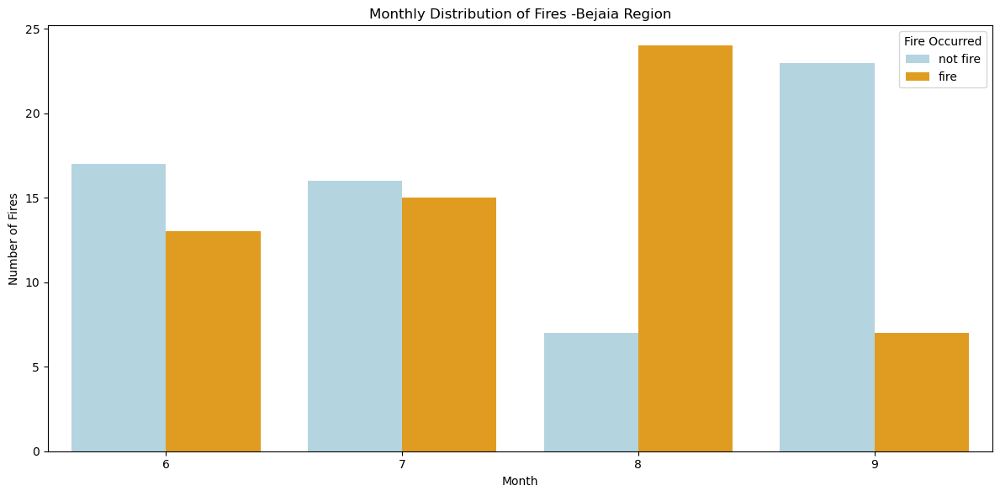

In [18]:
df.columns = df.columns.str.strip() #clean up the column names to ensure no hidden spaces


df['Classes'] = df['Classes'].str.strip()


df['month'] = df['month'].astype(str) #month column is converted to string so that seaborn treats it as a catergorical variable

month_order = [str(i) for i in range(6,10)] #only months june to september are selected


plt.figure(figsize=(12, 6)) #plots how many fire and non-fire occurences are present 
sns.countplot(
    data=df,
    x='month',
    hue='Classes',
    order=month_order,
    palette={'fire': 'orange', 'not fire': 'lightblue'}
)

plt.title("Monthly Distribution of Fires -Bejaia Region")
plt.xlabel("Month")
plt.ylabel("Number of Fires")
plt.legend(title='Fire Occurred')
plt.tight_layout()
plt.show()
#reference: https://seaborn.pydata.org/tutorial/distributions.html
#reference : https://github.com/sai-manas/FWI_Predictor_ML/blob/main/notebook/Algerian_forest_ML_project.ipynb

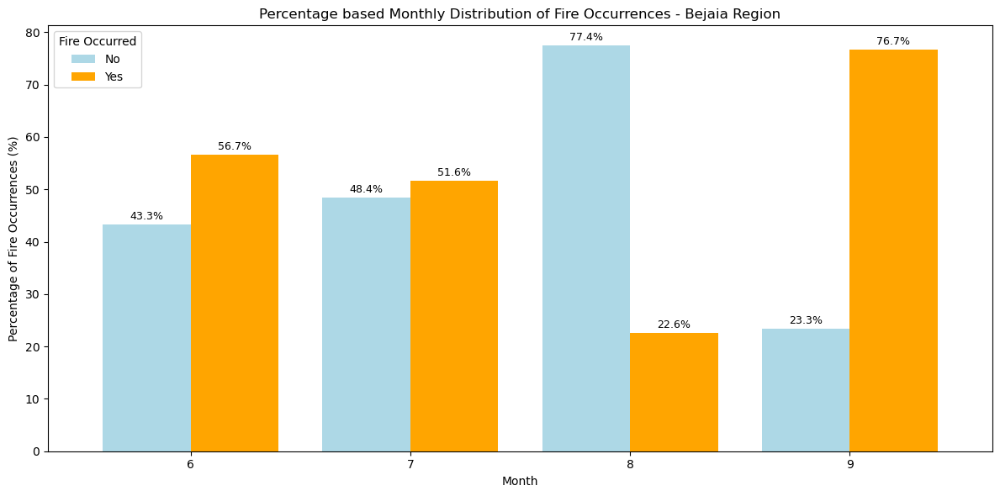

In [19]:
month_order = [str(i) for i in range(6, 10)] #month order is defined and only months June to spetember are used 

df['month'] = df['month'].astype(str) #month column is converted to string to make a catergorical variable 
df['month'] = pd.Categorical(df['month'], categories=month_order, ordered=True) #ensures the month appears correctly
df['Classes'] = df['Classes'].str.strip().str.lower() #removes any extra spaces in this column

fire_recorded = df.groupby(['month', 'Classes'], observed=True).size().unstack(fill_value=0)
fire_occurred_percentage = fire_recorded.div(fire_recorded.sum(axis=1), axis=0) * 100 #converts the previous found counts to percentages to accurately compare the fires and non-fires 

ax = fire_occurred_percentage.plot( #plots a barchat with the fire occured Vs not occured percentages
    kind='bar',
    color=['lightblue', 'orange'],
    figsize=(12,6),\
    width=0.8
)

plt.title("Percentage based Monthly Distribution of Fire Occurrences - Bejaia Region")
plt.xlabel("Month")
plt.ylabel("Percentage of Fire Occurrences (%)")
plt.legend(title='Fire Occurred', labels=['No','Yes'])
plt.xticks(rotation=0)
plt.tight_layout()

for p in ax.patches: #percentage labels for each bar is added (for clarity)
    ax.text(
        p.get_x() + p.get_width()/2,
        p.get_height() + 0.5,
        f'{p.get_height():.1f}%',
        ha='center',
        va='bottom',
        fontsize=9
    )

plt.show()



#reference: https://seaborn.pydata.org/tutorial/distributions.html
#reference: https://github.com/sai-manas/FWI_Predictor_ML/blob/main/notebook/Algerian_forest_ML_project.ipynb

Correlation Heat Map 

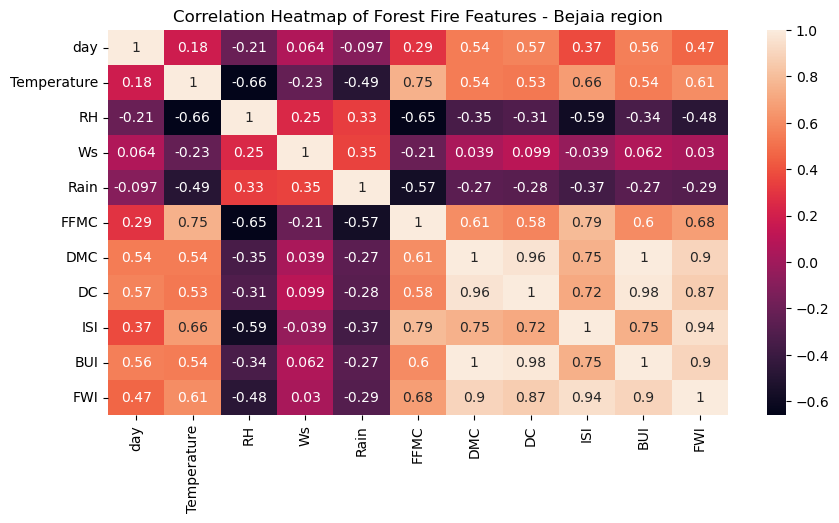

In [20]:
#plots the correlation heatmap 

corr_df = df.select_dtypes(include=[float, int]).drop(columns=['year'])

corr_matrix = corr_df.corr()

plt.figure(figsize=(10, 5))
sns.heatmap(
    corr_matrix,
    annot=True,
)
plt.title("Correlation Heatmap of Forest Fire Features - Bejaia region")
plt.show()
#reference: https://python-graph-gallery.com/92-control-color-in-seaborn-heatmaps/
#reference: https://www.geeksforgeeks.org/python/how-to-create-a-seaborn-correlation-heatmap-in-python/

Handling of Catergorical Values 

In [21]:
#uses label encoding to map catergorical features to its respective numerical values for month, day, season, Classes

Classes_map = {'fire':1, 'not fire':0}

df['Classes'] = df['Classes'].map(Classes_map)

#reference: https://pandas.pydata.org/docs/dev/reference/api/pandas.Categorical.map.html

Distribution of each feature 

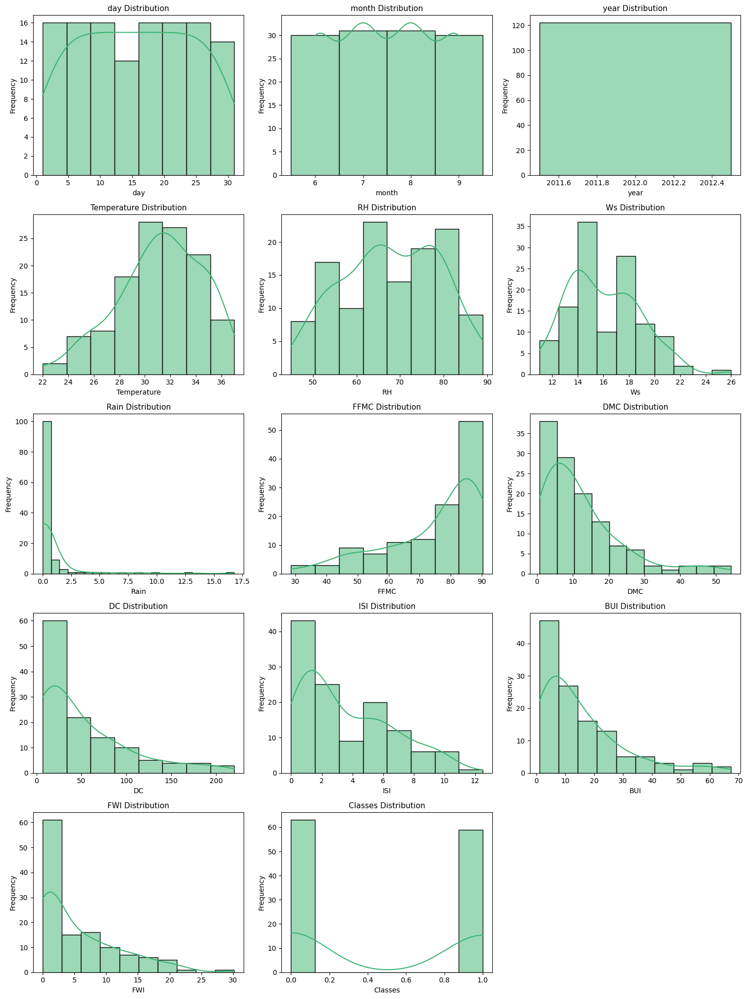

In [22]:

variables = df.columns #all columns in the dataset is used for distribution plotting
cols = 3  #sets the number of plots per row for the figure layout
rows = math.ceil(len(variables) / cols) #calculates the now of rows needed for the figure layout

plt.figure(figsize=(5*cols, 4*rows)) #sets the figure size based on the total number of rows and columns needed

for i, col in enumerate(variables, 1): #iterates thrugh each column 
    plt.subplot(rows, cols, i) #creates a subplot for each column 
    sns.histplot(df[col], kde=True, color='mediumseagreen', edgecolor='black') 
    plt.title(f'{col} Distribution', fontsize=11) #sets the title for each subplot
    plt.xlabel(col) #sets the x-axis label as the column name for each subplot
    plt.ylabel('Frequency') #sets the y-axis label as the frequency for each subplot 

plt.tight_layout()
plt.show()

#reference: https://www.w3schools.com/c/ref_math_ceil.php
#reference: https://www.w3schools.com/python/ref_func_enumerate.asp
#reference: https://www.statology.org/matplotlib-distribution-plot/

**Feature Scaling**

In [23]:
features = df.columns.drop('FWI') #all columns excepts FWI is used as the input features
target = 'FWI' #target variable is set as FWI

X = df[features]
y = df[target]

scaler = StandardScaler()  #standard scaler is used for feature scaling (z-score normalisation)
X_scaled = scaler.fit_transform(X)
X_scaled = pd.DataFrame(X_scaled, columns=features)

print("Summary after feature scaling:") #the statistical summary is displayed after feature scaling
print(X_scaled.describe().round(2))


Summary after feature scaling:
          day   month   year  Temperature      RH      Ws    Rain    FFMC  \
count  122.00  122.00  122.0       122.00  122.00  122.00  122.00  122.00   
mean     0.00    0.00    0.0         0.00   -0.00    0.00    0.00   -0.00   
std      1.00    1.00    0.0         1.00    1.00    1.00    1.00    1.00   
min     -1.68   -1.35    0.0        -2.78   -2.07   -1.76   -0.35   -2.97   
25%     -0.88   -0.45    0.0        -0.66   -0.72   -0.70   -0.35   -0.56   
50%      0.03    0.00    0.0        -0.05    0.00    0.00   -0.35    0.40   
75%      0.82    0.45    0.0         0.85    0.88    0.70   -0.14    0.78   
max      1.73    1.35    0.0         1.76    1.89    3.52    6.65    1.01   

          DMC      DC     ISI     BUI  Classes  
count  122.00  122.00  122.00  122.00   122.00  
mean    -0.00    0.00    0.00    0.00     0.00  
std      1.00    1.00    1.00    1.00     1.00  
min     -1.03   -0.90   -1.21   -0.99    -0.97  
25%     -0.77   -0.84   -0.84 

Box plot visualisation 

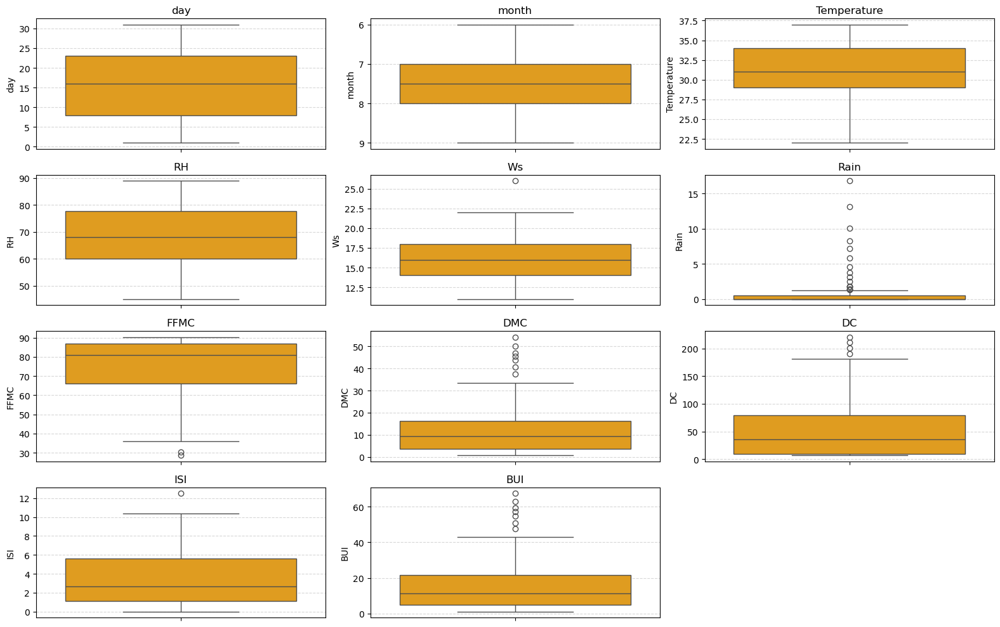

In [24]:

#box plot visualisation of the features after feature scaling
features = ["day", "month",	"Temperature","RH","Ws","Rain", "FFMC","DMC","DC","ISI","BUI"] #only the most relevant features are plotted (research is based on weather data and fire indices)

plt.figure(figsize=(16, 10))
for i, feature in enumerate(features, 1):
    plt.subplot(4, 3, i)      #creates a subplot for each feature and includes it in a 3 by 3 grid layout
    sns.boxplot(y=df[feature], color="orange")
    plt.title(feature)
    plt.grid(axis='y', linestyle='--', alpha=0.5)

plt.tight_layout()
plt.show()
#reference: https://stackoverflow.com/questions/59593943/multiple-boxplots-of-all-categorical-variables-in-one-plotting-window-using-seab

Handling of Outliers

Original dataset size: 122
Dataset size after capping outliers: 122


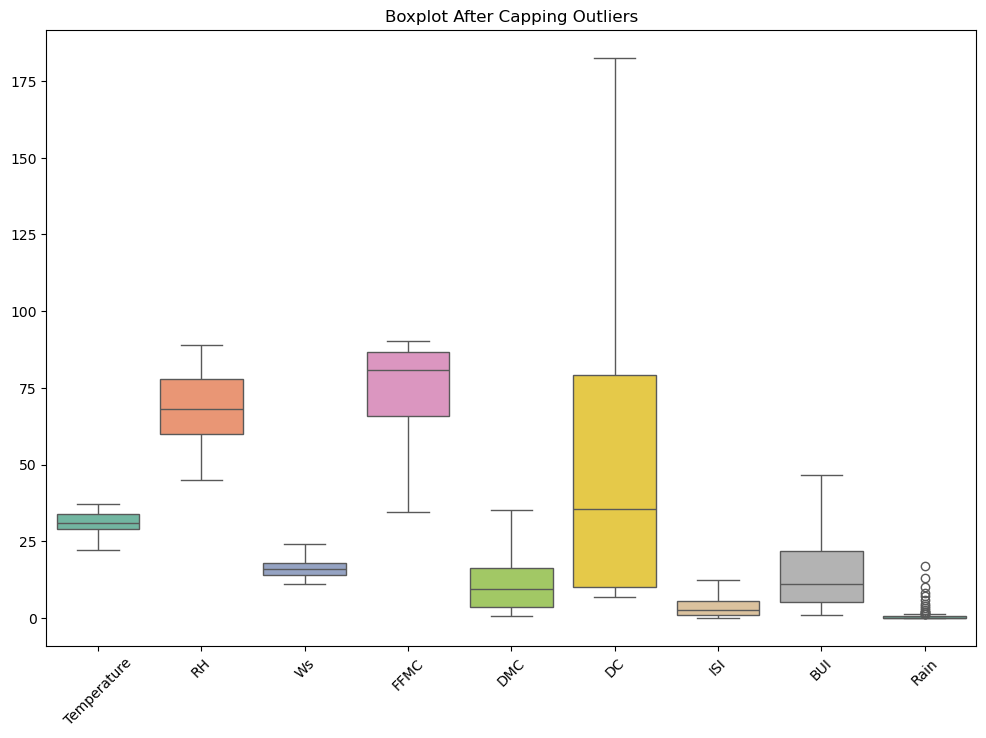

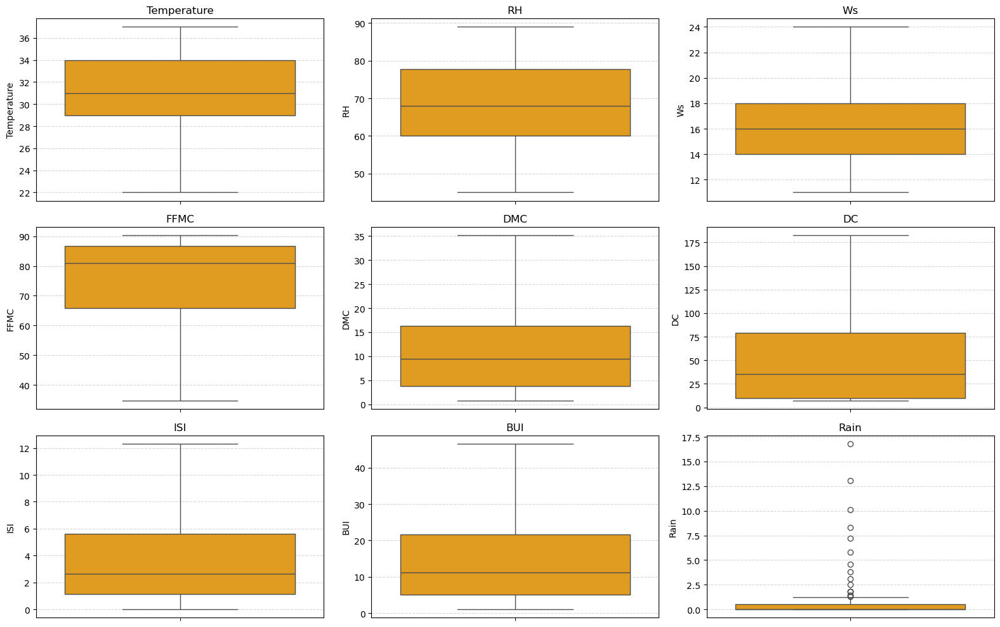

In [25]:

# following fuction is used to limit extreme values using IQR method
def cap_outliers(df, columns, factor=1.5): # k = 1.5 
    df = df.copy()
    for col in columns:
        Q1 = df[col].quantile(0.25)
        Q3 = df[col].quantile(0.75)
        IQR = Q3 - Q1
        lower = Q1 - factor * IQR
        upper = Q3 + factor * IQR
        df[col] = np.clip(df[col], lower, upper) #caps/replaces values outside the lower and upper bounds 
    return df

features =  ["Temperature","RH","Ws", "FFMC","DMC","DC","ISI","BUI"] #most relavant features (numerical) for the FWI is used 

df = cap_outliers(df, features) #caps the outliers using the preivously defined function (cap_outliers)

print(f"Original dataset size: {df.shape[0]}")
print(f"Dataset size after capping outliers: {df.shape[0]}")  # prints the size of the dataset after capping outliers to ensure the size is unchanged


scaler = StandardScaler()
X_scaled = scaler.fit_transform(df[features +['Rain']]) #features scales the capped dataset

#plots boxplots to visualise the capped outliers and ensure no outliers are present
plt.figure(figsize=(12,8))
sns.boxplot(data=df[features+['Rain']], palette="Set2")
plt.title("Boxplot After Capping Outliers")
plt.xticks(rotation=45)
plt.show()

# plots individual boxplots for a better visualisation of each feature in a 3 by 3 grid layout (easier to compare with the previous boxplot before capping)
plt.figure(figsize=(16, 10))
for i, feature in enumerate(features+['Rain'], 1):
    plt.subplot(3, 3, i)
    sns.boxplot(y=df[feature], color="orange")
    plt.title(feature)
    plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()
#reference: https://www.geeksforgeeks.org/data-visualization/box-plot-in-python-using-matplotlib/
#reference: https://stackoverflow.com/questions/42207920/how-to-take-floor-and-capping-for-removing-outliers
#reference: https://stackoverflow.com/questions/59593943/multiple-boxplots-of-all-categorical-variables-in-one-plotting-window-using-seab

**Feature Importance**

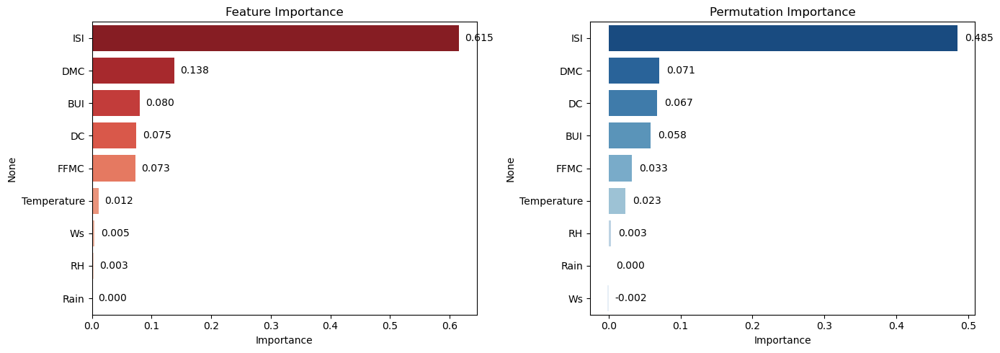

Feature Importance Comparison:
             Built-in  Permutation
BUI             0.080        0.058
DC              0.075        0.067
DMC             0.138        0.071
FFMC            0.073        0.033
ISI             0.615        0.485
RH              0.003        0.003
Rain            0.000        0.000
Temperature     0.012        0.023
Ws              0.005       -0.002


In [26]:

features = ["Temperature","RH","Ws", "Rain","FFMC","DMC","DC","ISI","BUI"] #same most relevant features as before is used 
target = 'FWI'

X = df[features] #capped dataset is used for training the RF model 
y = df[target]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42) #data is split into 80% training and 20% testing

model = RandomForestRegressor(n_estimators=100, random_state=42) #random forest regressor model is used with 100 trees/estimators 
model.fit(X_train, y_train)

#mdi feature importance and permutation feature importance are calculated
mdi_importances = pd.Series(model.feature_importances_, index=features).sort_values(ascending=False) #built-in feature importance from the random forest model 
perm_result = permutation_importance(model, X_test, y_test, n_repeats=10, random_state=42) 
perm_importances = pd.Series(perm_result.importances_mean, index=features).sort_values(ascending=False)


fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Plot for MDI - built-in feature importance
sns.barplot(x=mdi_importances.values, y=mdi_importances.index, hue=mdi_importances.index, 
            palette='Reds_r', ax=axes[0], legend=False)
axes[0].set_title('Feature Importance')
axes[0].set_xlabel('Importance')

for i, v in enumerate(mdi_importances.values): #values for each bar is added on the barplot
    axes[0].text(v + 0.01, i, f'{v:.3f}', va='center', fontsize=10)

# Plot 2 for the permutation feature importance
sns.barplot(x=perm_importances.values, y=perm_importances.index, hue=perm_importances.index,
            palette='Blues_r', ax=axes[1], legend=False)
axes[1].set_title('Permutation Importance')
axes[1].set_xlabel('Importance')

for i, v in enumerate(perm_importances.values): #values for each bar is added on the barplot
    axes[1].text(v + 0.01, i, f'{v:.3f}', va='center', fontsize=10)

plt.tight_layout()
plt.show()

#feature comparison table is printed 
print("Feature Importance Comparison:")
print(pd.DataFrame({'Built-in': mdi_importances, 'Permutation': perm_importances}).round(3))

#reference: https://www.geeksforgeeks.org/machine-learning/feature-importance-with-random-forests/ (built-in feature importance)
#reference: https://scikit-learn.org/stable/modules/permutation_importance.html
#reference: https://scikit-learn.org/stable/auto_examples/inspection/plot_permutation_importance.html#sphx-glr-auto-examples-inspection-plot-permutation-importance-py

Pearson Correlation 

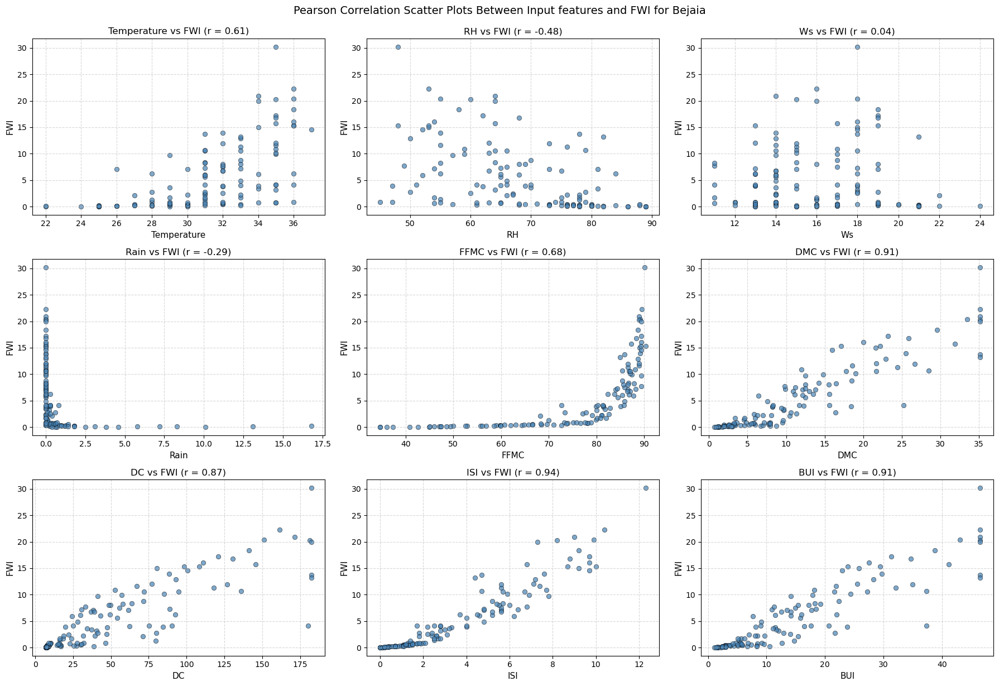

Pearson correlation coefficients for features and FWI:
Temperature: 0.608
RH: -0.476
Ws: 0.035
Rain: -0.293
FFMC: 0.681
DMC: 0.912
DC: 0.867
ISI: 0.943
BUI: 0.907


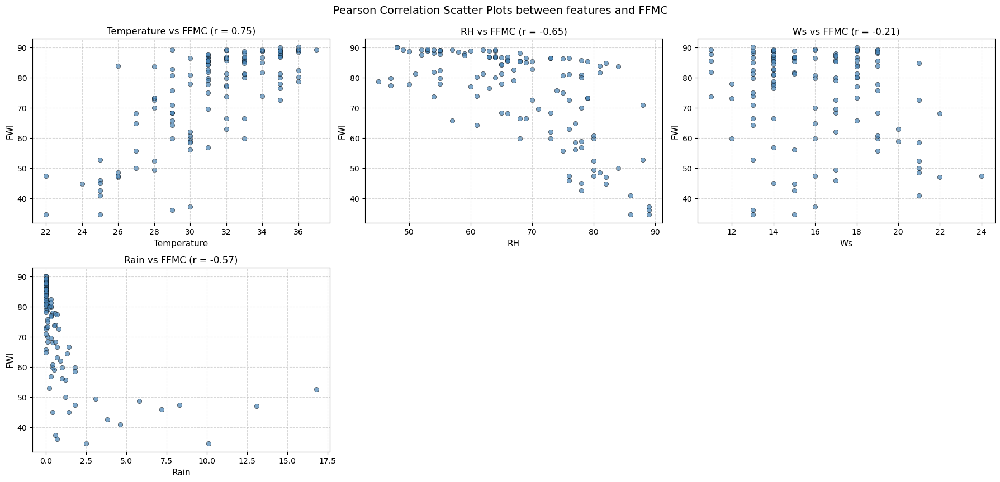

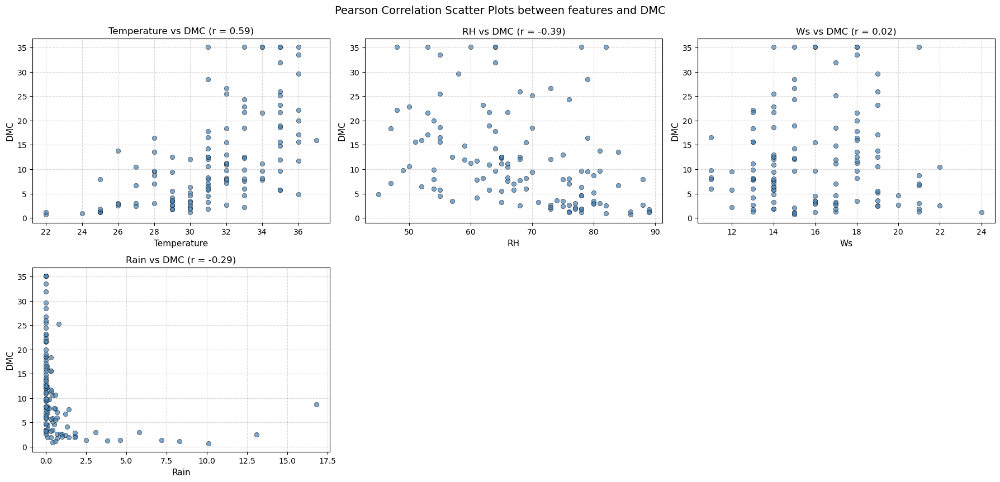

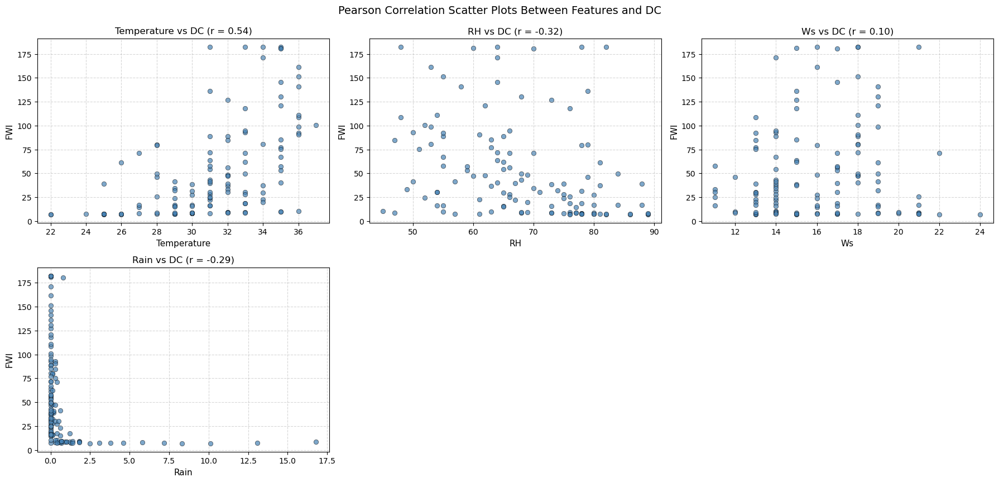

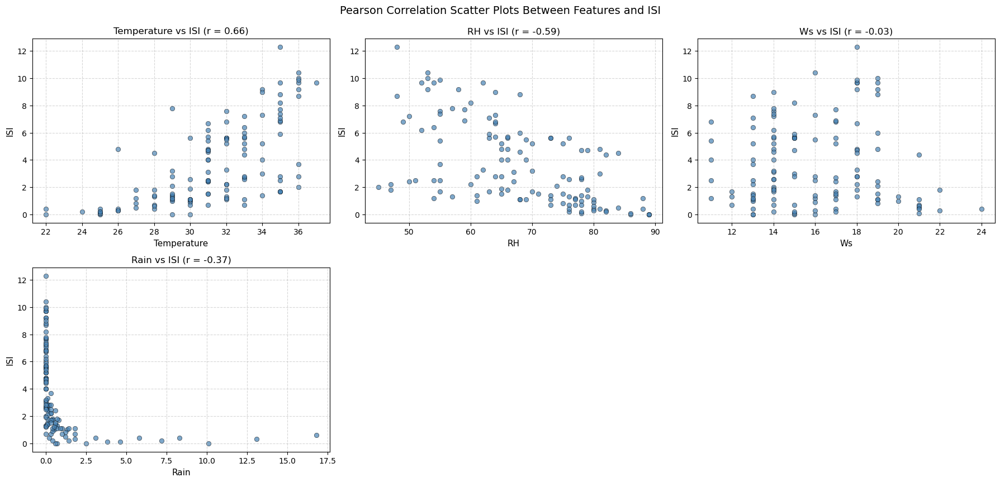

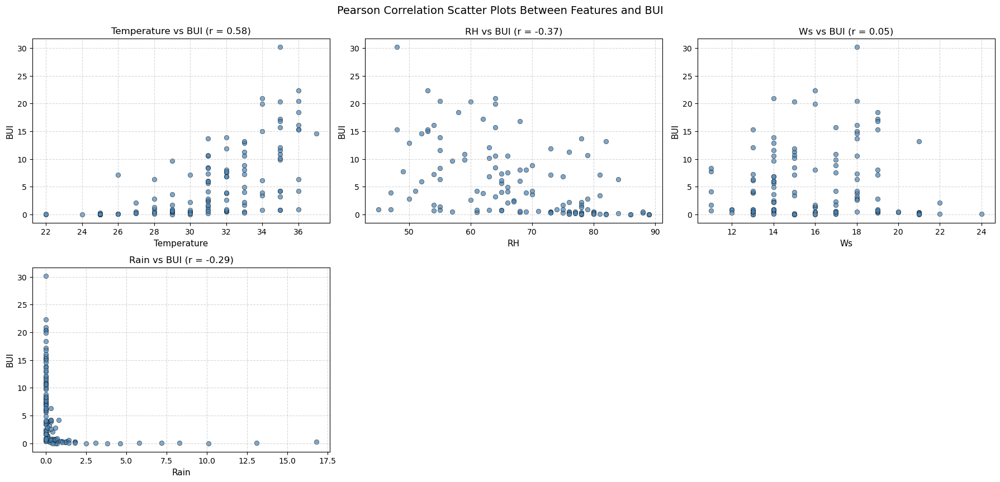

In [27]:
X = df[features]  #input features that include the following columns ('FFMC', 'DMC', 'DC', 'ISI', 'BUI', 'temp', 'RH', 'wind', 'rain)             
y = df['FWI']     #target output feature 


def covariance(X, y): #calculates the mean differences between the variables
    x_mean = np.mean(X)
    y_mean = np.mean(y)
    return sum((X[i] - x_mean) * (y[i] - y_mean) for i in range(len(X))) / len(X)

def pearson_correlation(X, y): #function to calculate pearson correlation matrix
    cov = covariance(X, y)
    std_dev_x = np.std(X)
    std_dev_y = np.std(y)
    if std_dev_x == 0 or std_dev_y == 0: 
        return np.nan  
    return cov / (std_dev_x * std_dev_y) #divides the calculated value in covariance function by the standard deviation (this value is the pearson correlation coefficient and it shows the relationship between the input feature and the output featue)

plt.figure(figsize=(18, 12))
for i, feature in enumerate(features, 1): #plots the scatter plot (this shows the relationship between the intput feature and the output feature)
    plt.subplot(3, 3, i)
    sns.scatterplot(
        x=df[feature],
        y=df['FWI'],
        color='steelblue',
        alpha=0.7,
        edgecolor='black'
    )
    
    
    if np.std(df[feature]) == 0 or np.std(df['FWI']) == 0:  #Calculates Pearson correlation coefficent for each feature
        r = np.nan
    else:
        r = np.corrcoef(df[feature], df['FWI'])[0, 1]

    plt.title(f'{feature} vs FWI (r = {r:.2f})', fontsize=12) #plots the scatter plot
    plt.xlabel(feature, fontsize=11)
    plt.ylabel('FWI', fontsize=11)
    plt.grid(True, linestyle='--', alpha=0.5)

plt.tight_layout()
plt.suptitle("Pearson Correlation Scatter Plots Between Input features and FWI for Bejaia", fontsize=14, y=1.02)
plt.show()

correlations = {}
for col in X.columns:
    correlations[col] = pearson_correlation(X[col].values, y.values)

print("Pearson correlation coefficients for features and FWI:")
for feature, r in correlations.items():
    print(f"{feature}: {r:.3f}")

#(Additional), the pearson coeffficents for each feature is printed 
#the following pearson correlation coefficients are found and scatter plots are plotted for each index to get a better understanding about the feature relations 
#Pearson correlation for FFMC
weather_features = ["Temperature","RH","Ws","Rain"]
X = df[weather_features]               
y = df['FFMC']

plt.figure(figsize=(18, 12))
for i, weather_feature in enumerate(weather_features, 1):
    plt.subplot(3, 3, i)
    sns.scatterplot(
        x=df[weather_feature],
        y=df['FFMC'],
        color='steelblue',
        alpha=0.7,
        edgecolor='black'
    )
    
    # correlation for each feature is calculated
    if np.std(df[weather_feature]) == 0 or np.std(df['FFMC']) == 0:
        r = np.nan
    else:
        r = np.corrcoef(df[weather_feature], df['FFMC'])[0, 1]

    plt.title(f'{weather_feature} vs FFMC (r = {r:.2f})', fontsize=12)
    plt.xlabel(weather_feature, fontsize=11)
    plt.ylabel('FWI', fontsize=11)
    plt.grid(True, linestyle='--', alpha=0.5)

plt.tight_layout()
plt.suptitle("Pearson Correlation Scatter Plots between features and FFMC", fontsize=14, y=1.02)
plt.show()

#Pearson correlation for DMC

X = df[weather_features]               
y = df['DMC']

plt.figure(figsize=(18, 12))
for i, weather_feature in enumerate(weather_features, 1):
    plt.subplot(3, 3, i)
    sns.scatterplot(
        x=df[weather_feature],
        y=df['DMC'],
        color='steelblue',
        alpha=0.7,
        edgecolor='black'
    )
    
    # correlation for each feature is calculated
    if np.std(df[weather_feature]) == 0 or np.std(df['DMC']) == 0:
        r = np.nan
    else:
        r = np.corrcoef(df[weather_feature], df['DMC'])[0, 1]

    plt.title(f'{weather_feature} vs DMC (r = {r:.2f})', fontsize=12)
    plt.xlabel(weather_feature, fontsize=11)
    plt.ylabel('DMC', fontsize=11)
    plt.grid(True, linestyle='--', alpha=0.5)

plt.tight_layout()
plt.suptitle("Pearson Correlation Scatter Plots between features and DMC", fontsize=14, y=1.02)
plt.show()

#pearson correlation for DC

X = df[weather_features]               
y = df['DC']

plt.figure(figsize=(18, 12))
for i, weather_feature in enumerate(weather_features, 1):
    plt.subplot(3, 3, i)
    sns.scatterplot(
        x=df[weather_feature],
        y=df['DC'],
        color='steelblue',
        alpha=0.7,
        edgecolor='black'
    )
    
    # correlation for each feature is calculated
    if np.std(df[weather_feature]) == 0 or np.std(df['DC']) == 0:
        r = np.nan
    else:
        r = np.corrcoef(df[weather_feature], df['DC'])[0, 1]

    plt.title(f'{weather_feature} vs DC (r = {r:.2f})', fontsize=12)
    plt.xlabel(weather_feature, fontsize=11)
    plt.ylabel('FWI', fontsize=11)
    plt.grid(True, linestyle='--', alpha=0.5)

plt.tight_layout()
plt.suptitle("Pearson Correlation Scatter Plots Between Features and DC", fontsize=14, y=1.02)
plt.show() 

#pearson correlation for ISI

X = df[weather_features]               
y = df['ISI']

plt.figure(figsize=(18, 12))
for i, weather_feature in enumerate(weather_features, 1):
    plt.subplot(3, 3, i)
    sns.scatterplot(
        x=df[weather_feature],
        y=df['ISI'],
        color='steelblue',
        alpha=0.7,
        edgecolor='black'
    )
    

    if np.std(df[weather_feature]) == 0 or np.std(df['ISI']) == 0: # correlation for each feature is calculated
        r = np.nan
    else:
        r = np.corrcoef(df[weather_feature], df['ISI'])[0, 1]

    plt.title(f'{weather_feature} vs ISI (r = {r:.2f})', fontsize=12)
    plt.xlabel(weather_feature, fontsize=11)
    plt.ylabel('ISI', fontsize=11)
    plt.grid(True, linestyle='--', alpha=0.5)

plt.tight_layout()
plt.suptitle("Pearson Correlation Scatter Plots Between Features and ISI", fontsize=14, y=1.02)
plt.show()

#pearson correlation for BUI

X = df[weather_features]               
y = df['BUI']

plt.figure(figsize=(18, 12))
for i, weather_feature in enumerate(weather_features, 1):
    plt.subplot(3, 3, i)
    sns.scatterplot(
        x=df[weather_feature],
        y=df['FWI'],
        color='steelblue',
        alpha=0.7,
        edgecolor='black'
    )
    
    \
    if np.std(df[weather_feature]) == 0 or np.std(df['BUI']) == 0: # correlation for each feature is calculated
        r = np.nan
    else:
        r = np.corrcoef(df[weather_feature], df['BUI'])[0, 1]

    plt.title(f'{weather_feature} vs BUI (r = {r:.2f})', fontsize=12)
    plt.xlabel(weather_feature, fontsize=11)
    plt.ylabel('BUI', fontsize=11)
    plt.grid(True, linestyle='--', alpha=0.5)

plt.tight_layout()
plt.suptitle("Pearson Correlation Scatter Plots Between Features and BUI", fontsize=14, y=1.02)
plt.show()


#reference: https://medium.com/@shivogojohn/pearson-correlation-coefficient-in-python-74fb569f2b7f


**Model Development**

Model 1 - using all input features 

[I 2025-11-09 15:52:06,439] A new study created in memory with name: no-name-66987358-0d3d-4f00-a48e-68bc855bbc23


  0%|          | 0/1000 [00:00<?, ?it/s]

[0]	test-rmse:4.31985
[1]	test-rmse:3.18521
[2]	test-rmse:2.49206
[3]	test-rmse:2.01244
[4]	test-rmse:1.72435
[5]	test-rmse:1.33215
[6]	test-rmse:1.18641
[7]	test-rmse:1.12147
[8]	test-rmse:1.01096
[9]	test-rmse:1.00439
[10]	test-rmse:0.95317
[11]	test-rmse:0.94230
[12]	test-rmse:0.94036
[13]	test-rmse:0.93523
[14]	test-rmse:0.93262
[15]	test-rmse:0.92907
[16]	test-rmse:0.92643
[17]	test-rmse:0.92583
[18]	test-rmse:0.92467
[19]	test-rmse:0.92385
[20]	test-rmse:0.92327
[21]	test-rmse:0.92327
[22]	test-rmse:0.90204
[23]	test-rmse:0.90194
[24]	test-rmse:0.90125
[25]	test-rmse:0.90125
[26]	test-rmse:0.90122
[27]	test-rmse:0.89216
[28]	test-rmse:0.89216
[29]	test-rmse:0.87480
[30]	test-rmse:0.87480
[31]	test-rmse:0.87480
[32]	test-rmse:0.87480
[33]	test-rmse:0.87480
[34]	test-rmse:0.87119
[35]	test-rmse:0.87095
[36]	test-rmse:0.86795
[37]	test-rmse:0.86795
[38]	test-rmse:0.86795
[39]	test-rmse:0.85606
[40]	test-rmse:0.85461
[41]	test-rmse:0.85461
[42]	test-rmse:0.85461
[43]	test-rmse:0.8546

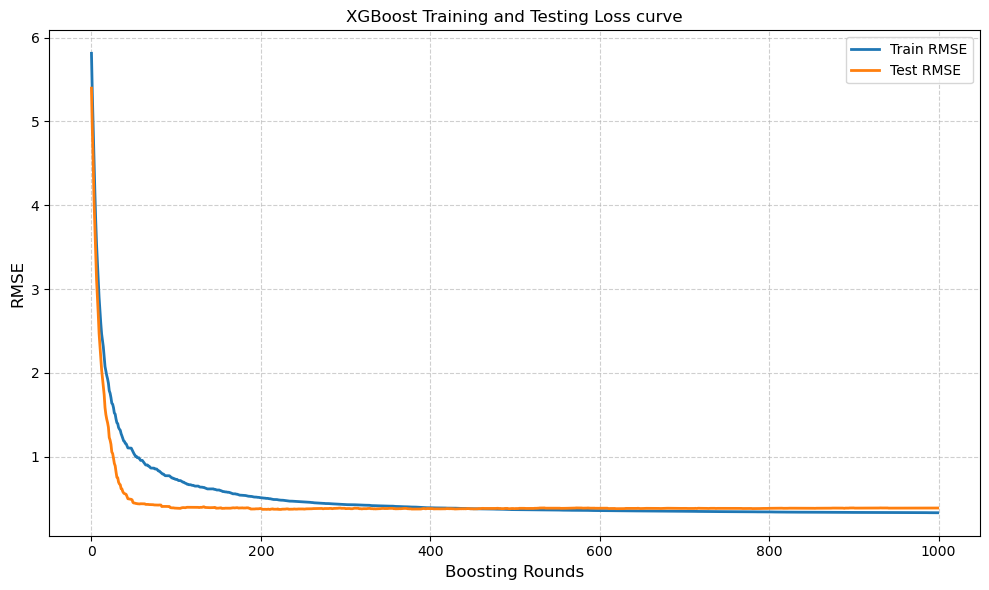

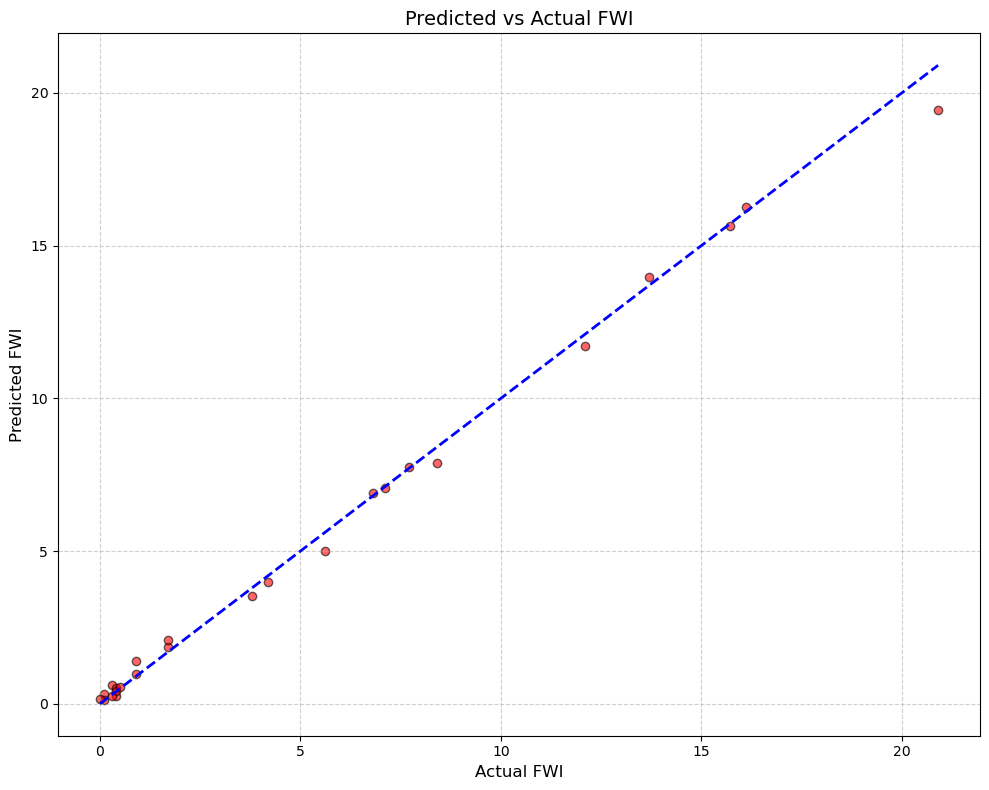

In [28]:
features = ["Temperature","RH","Ws", "Rain","FFMC","DMC","DC","ISI","BUI"]
target = 'FWI'

X = df[features]
y = df[target]

X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=0.2, random_state=0) #splits the dataset to 80% training and 20% testing 

xgb_train = xgb.DMatrix(X_train, y_train) #converts the inputs to a DMatrix object 
xgb_test = xgb.DMatrix(X_test, y_test)


def objective(trial): #the hyperparameter tuning objective function is defined 
    params = {
        "objective": "reg:squarederror",
        "learning_rate": trial.suggest_float("learning_rate", 0.001, 0.5),
        "max_depth": trial.suggest_int("max_depth", 3, 10),
        "subsample": trial.suggest_float("subsample", 0.5, 1.0),
        "colsample_bytree": trial.suggest_float("colsample_bytree", 0.5, 1.0),
        "lambda": trial.suggest_float("lambda", 1e-8, 5),
        "alpha": trial.suggest_float("alpha", 1e-8, 5),
        "seed": 42
    }
    
    model = xgb.train(params=params, dtrain=xgb_train, num_boost_round=100, #model is trained using the intially defined parameters
                      evals=[(xgb_test, 'test')],
                      verbose_eval=True)
    
    preds = model.predict(xgb_test)
    rmse = np.sqrt(mean_squared_error(y_test, preds))
    return rmse

study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=1000, show_progress_bar=True)
best_params = study.best_params.copy()
best_params['objective'] = 'reg:squarederror'
best_params['seed'] = 42
print ("Best hyperparameters:", best_params)  #using optuna the best parameters are found 

#loss curve plotting
evals_result = {}
final_model = xgb.train(   #the final model is trained on the best parameters
    params=best_params,
    dtrain=xgb_train,
    num_boost_round=1000,
    evals=[(xgb_train, 'train'), (xgb_test, 'test')],
    evals_result=evals_result,
    verbose_eval=True
)

preds = final_model.predict(xgb_test)   
r2 = r2_score(y_test, preds)
rmse = np.sqrt(mean_squared_error(y_test, preds))
mae = np.mean(np.abs((y_test - preds)))

print(f"R² Score: {r2:.3f}")
print(f"RMSE: {rmse:.3f}")
print(f"MAE: {mae:.3f}")

train_rmse_val = evals_result['train']['rmse']
test_rmse_val = evals_result['test']['rmse']

plt.figure(figsize=(10, 6))
plt.plot(train_rmse_val, label='Train RMSE', linewidth=2)
plt.plot(test_rmse_val, label='Test RMSE', linewidth=2)
plt.xlabel('Boosting Rounds', fontsize=12)
plt.ylabel('RMSE', fontsize=12)
plt.title('XGBoost Training and Testing Loss curve', fontsize=12) #loss curve is plotted
plt.legend(fontsize=10)
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

plt.figure(figsize=(10, 8))
plt.scatter(y_test, preds, color='red', alpha=0.6, edgecolor='black')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], 'b--', linewidth=2)  #Predicted VS Actual plot is plotted
plt.xlabel("Actual FWI", fontsize=12)
plt.ylabel("Predicted FWI", fontsize=12)
plt.title("Predicted vs Actual FWI", fontsize=14)
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show() 



#reference: https://www.geeksforgeeks.org/machine-learning/implementation-of-xgboost-extreme-gradient-boosting/
#reference: https://xgboost.readthedocs.io/en/stable/python/examples/evals_result.html
#reference: hhttps://machinelearningmastery.com/tune-xgboost-performance-with-learning-curves/ttps://machinelearningmastery.com/tune-xgboost-performance-with-learning-curves/   (to confirm the shape of the learning curve)
#reference: https://github.com/ishandandekar/misc/blob/8711f9bcd8866ed3f220b2bf3f647993c6884283/xgboost_optuna.py#L15-L17

XGBoost model without hyperparameter optimisation

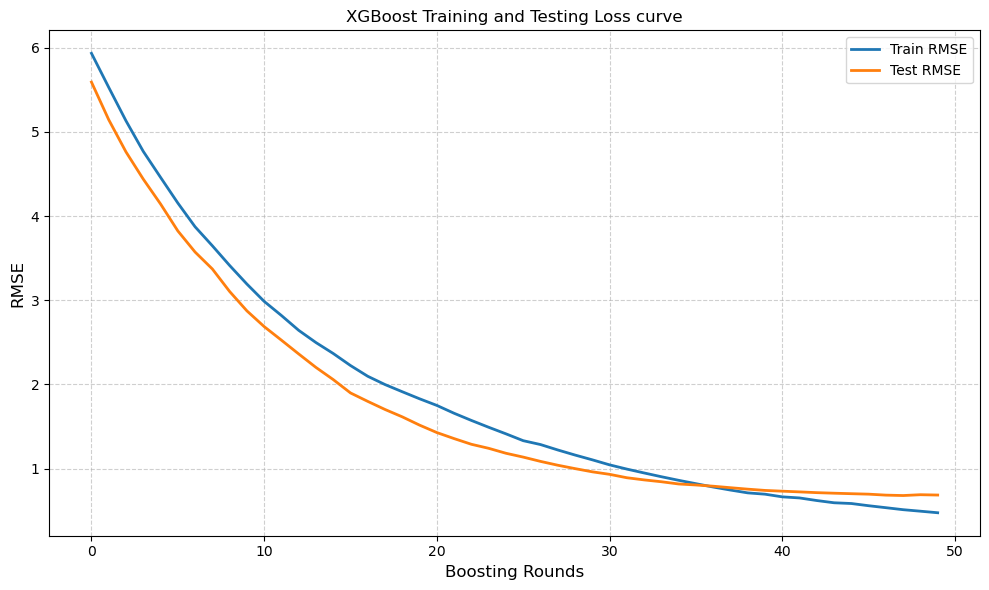

R² Score: 0.987
RMSE: 0.685
MAE: 0.461


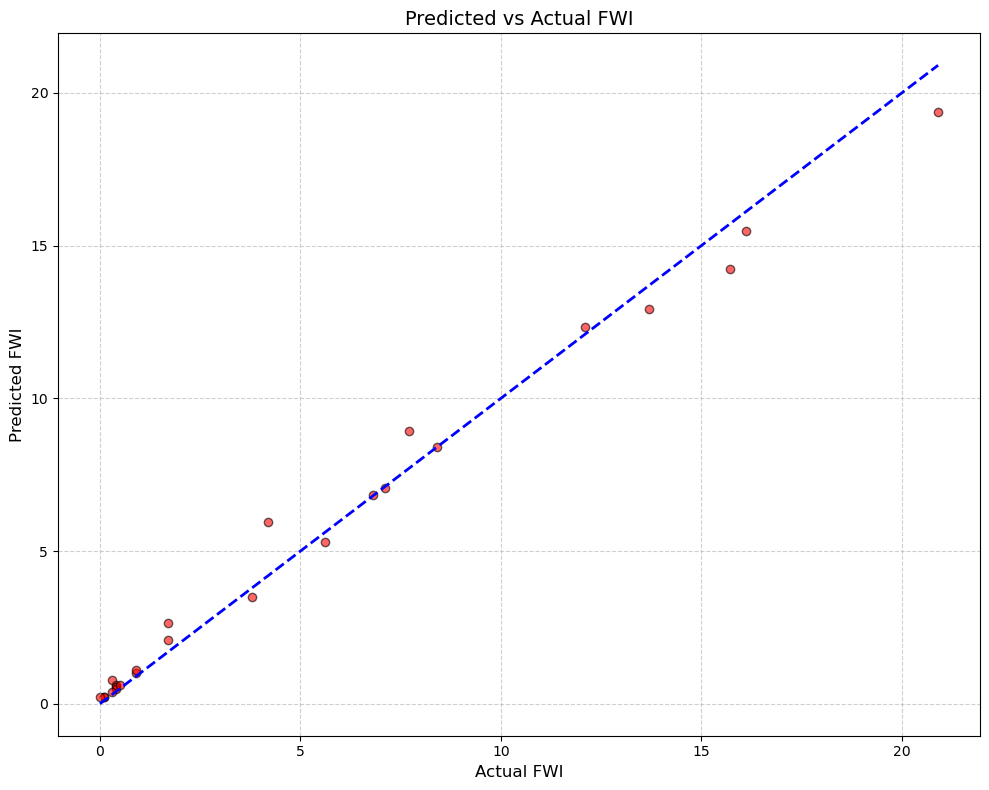

   day month  year  Temperature  RH  Ws  Rain   FFMC  DMC    DC  ISI  BUI  \
0    1     6  2012           29  57  18   0.0  65.70  3.4   7.6  1.3  3.4   
1    2     6  2012           29  61  13   1.3  64.40  4.1   7.6  1.0  3.9   
2    3     6  2012           26  82  22  13.1  47.10  2.5   7.1  0.3  2.7   
3    4     6  2012           25  89  13   2.5  34.65  1.3   6.9  0.0  1.7   
4    5     6  2012           27  77  16   0.0  64.80  3.0  14.2  1.2  3.9   

   FWI  Classes  
0  0.5        0  
1  0.4        0  
2  0.1        0  
3  0.0        0  
4  0.5        0   



In [29]:

features = ["Temperature","RH","Ws", "Rain","FFMC","DMC","DC","ISI","BUI"] #input features
target = 'FWI' #target variable

X = df[features]
y = df[target]

X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=0.2, random_state=0) #splits the dataset to 80% training and 20% testing 


xgb_train = xgb.DMatrix(X_train, y_train) #converts the inputs to a DMatrix object 
xgb_test = xgb.DMatrix(X_test, y_test)

#Parameters for the XGBoost model is defined 
params = { 
    "objective": "reg:squarederror",
    "learning_rate": 0.0835,
    "max_depth": 4,
    "subsample": 0.8,
    "colsample_bytree": 0.8,
    "lambda": 1,
    "alpha": 0.1,
    "seed": 42
}
n=50 #number of boosting rounds/n_estimators = n is set to 50

evals_result = {} #stores the training and testing evaluation values 

model = xgb.train(params=params,dtrain=xgb_train,num_boost_round=n, evals=[(xgb_train, 'train'), (xgb_test, 'test')],evals_result=evals_result, verbose_eval=False) #model is trained 

train_rmse_val = evals_result['train']['rmse'] #all training rmse values are extracted
test_rmse_val = evals_result['test']['rmse'] #all testing rmse values are extracted

plt.figure(figsize=(10, 6)) #loss curve is plotted using the rmse values for training and testing 
plt.plot(train_rmse_val, label='Train RMSE', linewidth=2)
plt.plot(test_rmse_val, label='Test RMSE', linewidth=2)
plt.xlabel('Boosting Rounds', fontsize=12)
plt.ylabel('RMSE', fontsize=12)
plt.title('XGBoost Training and Testing Loss curve', fontsize=12)
plt.legend(fontsize=10)
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

preds = model.predict(xgb_test)  #the FWI is predicted for the testing dataset 
r2 = r2_score(y_test, preds)     #calculates the r2 value
rmse = np.sqrt(mean_squared_error(y_test, preds)) #calculates the RMSE value
mae = np.mean(np.abs((y_test - preds))) #calculates the mean absolute error

print(f"R² Score: {r2:.3f}") #r2 score is calculated
print(f"RMSE: {rmse:.3f}") #rmse score is calculated
print(f"MAE: {mae:.3f}") #Mean absolute error is calculaeted

plt.figure(figsize=(10, 8))
plt.scatter(y_test, preds, color='red', alpha=0.6, edgecolor='black') #the predicted Vs Actual plot is plotted 
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], 'b--', linewidth=2) 
plt.xlabel("Actual FWI", fontsize=12)
plt.ylabel("Predicted FWI", fontsize=12)
plt.title("Predicted vs Actual FWI", fontsize=14)
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()


print(df.head(), '\n') 


**Model 2 - Only weather data**

XGBoost

[I 2025-11-09 15:57:07,961] A new study created in memory with name: no-name-e3916c3c-ce8d-42fb-9806-25850de1e8c8


  0%|          | 0/1000 [00:00<?, ?it/s]

[0]	test-rmse:5.85891
[1]	test-rmse:5.67658
[2]	test-rmse:5.53208
[3]	test-rmse:5.36185
[4]	test-rmse:5.21634
[5]	test-rmse:5.06226
[6]	test-rmse:4.89728
[7]	test-rmse:4.75537
[8]	test-rmse:4.60673
[9]	test-rmse:4.47371
[10]	test-rmse:4.36174
[11]	test-rmse:4.26613
[12]	test-rmse:4.15735
[13]	test-rmse:4.05404
[14]	test-rmse:3.95737
[15]	test-rmse:3.88965
[16]	test-rmse:3.80398
[17]	test-rmse:3.75354
[18]	test-rmse:3.70177
[19]	test-rmse:3.66512
[20]	test-rmse:3.60369
[21]	test-rmse:3.54533
[22]	test-rmse:3.51651
[23]	test-rmse:3.46846
[24]	test-rmse:3.44277
[25]	test-rmse:3.38937
[26]	test-rmse:3.35490
[27]	test-rmse:3.32522
[28]	test-rmse:3.28835
[29]	test-rmse:3.27301
[30]	test-rmse:3.23434
[31]	test-rmse:3.19634
[32]	test-rmse:3.16289
[33]	test-rmse:3.13255
[34]	test-rmse:3.09862
[35]	test-rmse:3.08443
[36]	test-rmse:3.08384
[37]	test-rmse:3.06989
[38]	test-rmse:3.06440
[39]	test-rmse:3.05037
[40]	test-rmse:3.05107
[41]	test-rmse:3.03581
[42]	test-rmse:3.02225
[43]	test-rmse:3.0063

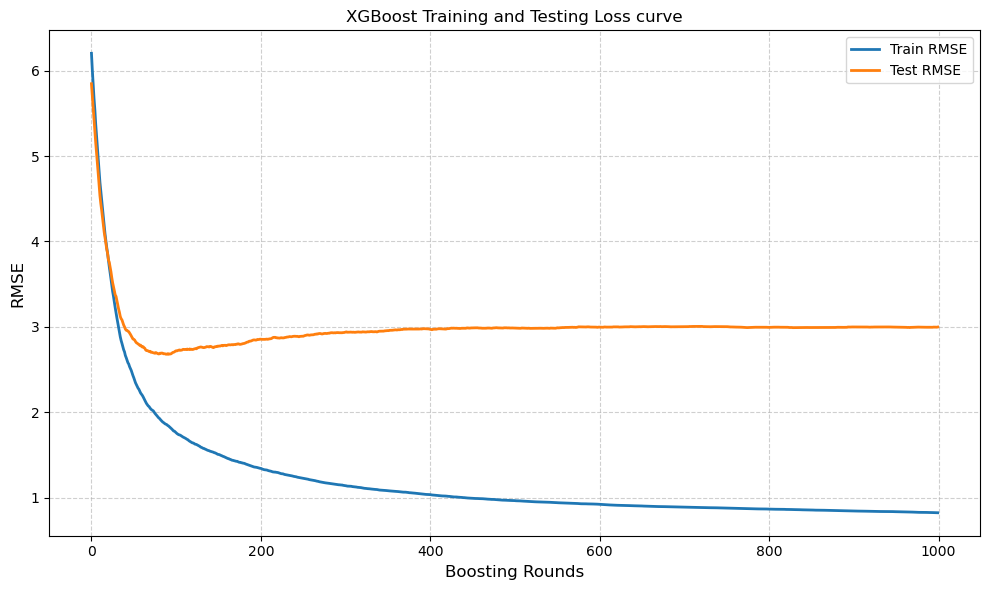

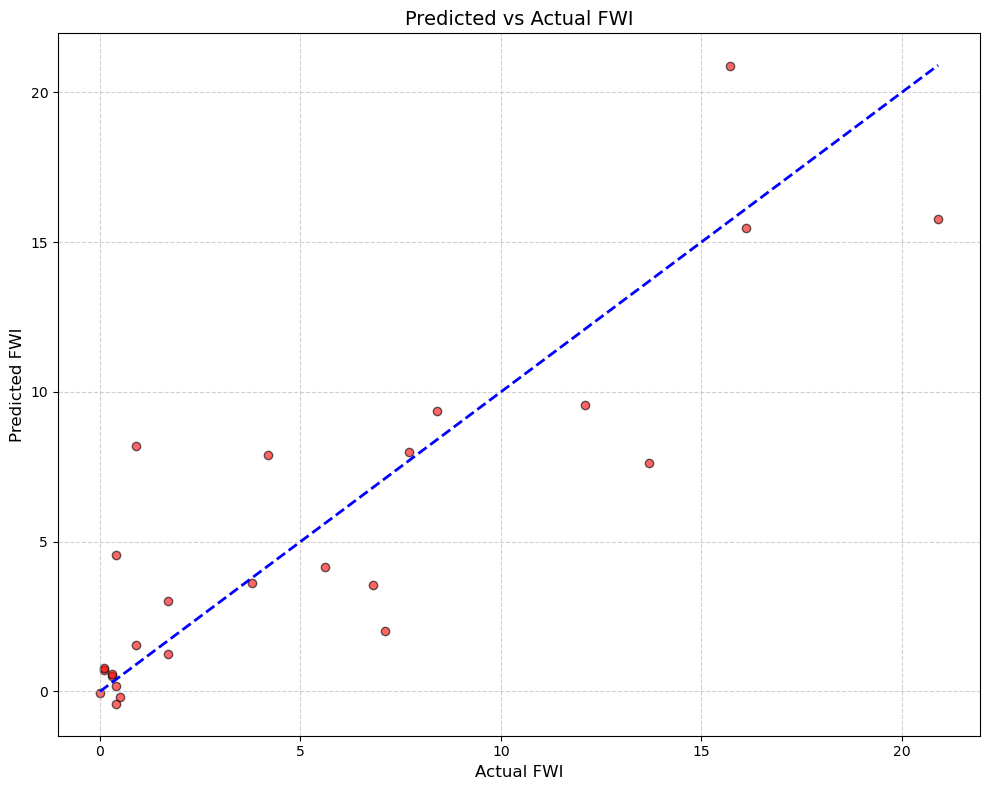

In [30]:


features = ["Temperature","RH","Ws","Rain","day"] #input features used
target = 'FWI' #target variable

X = df[features] #input features
y = df[target]  #target

X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=0.2, random_state=0) #splits the dataset to 80% training and 20% testing 

xgb_train = xgb.DMatrix(X_train, y_train) #converts the inputs to a DMatrix object 
xgb_test = xgb.DMatrix(X_test, y_test)


def objective(trial): #the hyperparameter tuning objective function is defined 
    params = {
        "objective": "reg:squarederror",
        "learning_rate": trial.suggest_float("learning_rate", 0.001, 0.5),
        "max_depth": trial.suggest_int("max_depth", 3, 10),
        "subsample": trial.suggest_float("subsample", 0.5, 1.0),
        "colsample_bytree": trial.suggest_float("colsample_bytree", 0.5, 1.0),
        "lambda": trial.suggest_float("lambda", 1e-8, 5),
        "alpha": trial.suggest_float("alpha", 1e-8, 5),
        "seed": 42
    }
    
    model = xgb.train(params=params, dtrain=xgb_train, num_boost_round=100, #model is trained using the intially defined parameters
                      evals=[(xgb_test, 'test')],
                      verbose_eval=True)
    
    preds = model.predict(xgb_test)
    rmse = np.sqrt(mean_squared_error(y_test, preds))
    return rmse

study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=1000, show_progress_bar=True)
best_params = study.best_params.copy()
best_params['objective'] = 'reg:squarederror'
best_params['seed'] = 42
print ("Best hyperparameters:", best_params)  #using optuna the best parameters are found 


evals_result = {}
final_model = xgb.train(   #the final model is trained on the best parameters
    params=best_params,
    dtrain=xgb_train,
    num_boost_round=1000,
    evals=[(xgb_train, 'train'), (xgb_test, 'test')],
    evals_result=evals_result,
    verbose_eval=True
)

preds = final_model.predict(xgb_test)   #the FWI is predicted for the testing dataset 
r2 = r2_score(y_test, preds)   #calculates the r2 value
rmse = np.sqrt(mean_squared_error(y_test, preds))  #calculates the RMSE value
mae = np.mean(np.abs((y_test - preds)))#calculates the mean absolute error

print(f"R² Score: {r2:.3f}") #r2 score is calculated
print(f"RMSE: {rmse:.3f}") #rmse score is calculated
print(f"MAE: {mae:.3f}") #Mean absolute error is calculaeted

train_rmse_val = evals_result['train']['rmse'] #all training rmse values are extracted
test_rmse_val = evals_result['test']['rmse'] #all testing rmse values are extracted

plt.figure(figsize=(10, 6))
plt.plot(train_rmse_val, label='Train RMSE', linewidth=2)
plt.plot(test_rmse_val, label='Test RMSE', linewidth=2)
plt.xlabel('Boosting Rounds', fontsize=12)
plt.ylabel('RMSE', fontsize=12)
plt.title('XGBoost Training and Testing Loss curve', fontsize=12) #loss curve is plotted
plt.legend(fontsize=10)
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

plt.figure(figsize=(10, 8))
plt.scatter(y_test, preds, color='red', alpha=0.6, edgecolor='black')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], 'b--', linewidth=2)  #Predicted VS Actual plot is plotted
plt.xlabel("Actual FWI", fontsize=12)
plt.ylabel("Predicted FWI", fontsize=12)
plt.title("Predicted vs Actual FWI", fontsize=14)
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show() 

#reference: https://www.geeksforgeeks.org/machine-learning/implementation-of-xgboost-extreme-gradient-boosting/
#reference: https://xgboost.readthedocs.io/en/stable/python/examples/evals_result.html
#reference: hhttps://machinelearningmastery.com/tune-xgboost-performance-with-learning-curves/ttps://machinelearningmastery.com/tune-xgboost-performance-with-learning-curves/   (to confirm the shape of the learning curve)
#reference: https://github.com/ishandandekar/misc/blob/8711f9bcd8866ed3f220b2bf3f647993c6884283/xgboost_optuna.py#L15-L17

XGBoost Regressor

[I 2025-11-09 16:03:14,365] A new study created in memory with name: no-name-759e6974-02bb-4820-812f-1a49f4e28144
[I 2025-11-09 16:03:14,452] Trial 0 finished with value: 3.538609302976244 and parameters: {'n_estimators': 332, 'max_depth': 3, 'learning_rate': 0.09954918554175016, 'subsample': 0.9538728205201835, 'colsample_bytree': 0.6149573207083143, 'reg_lambda': 0.0017543710413058008, 'reg_alpha': 1.4042924444112708}. Best is trial 0 with value: 3.538609302976244.
[I 2025-11-09 16:03:14,667] Trial 1 finished with value: 3.5942927582095066 and parameters: {'n_estimators': 857, 'max_depth': 8, 'learning_rate': 0.21606034497430043, 'subsample': 0.6189144129576846, 'colsample_bytree': 0.7864979022013061, 'reg_lambda': 2.969668410619316, 'reg_alpha': 2.4672212039088337}. Best is trial 0 with value: 3.538609302976244.
[I 2025-11-09 16:03:14,913] Trial 2 finished with value: 3.3552023222028367 and parameters: {'n_estimators': 952, 'max_depth': 6, 'learning_rate': 0.07163822162187708, 'subs

XGBoost R²: 0.7557240490757748


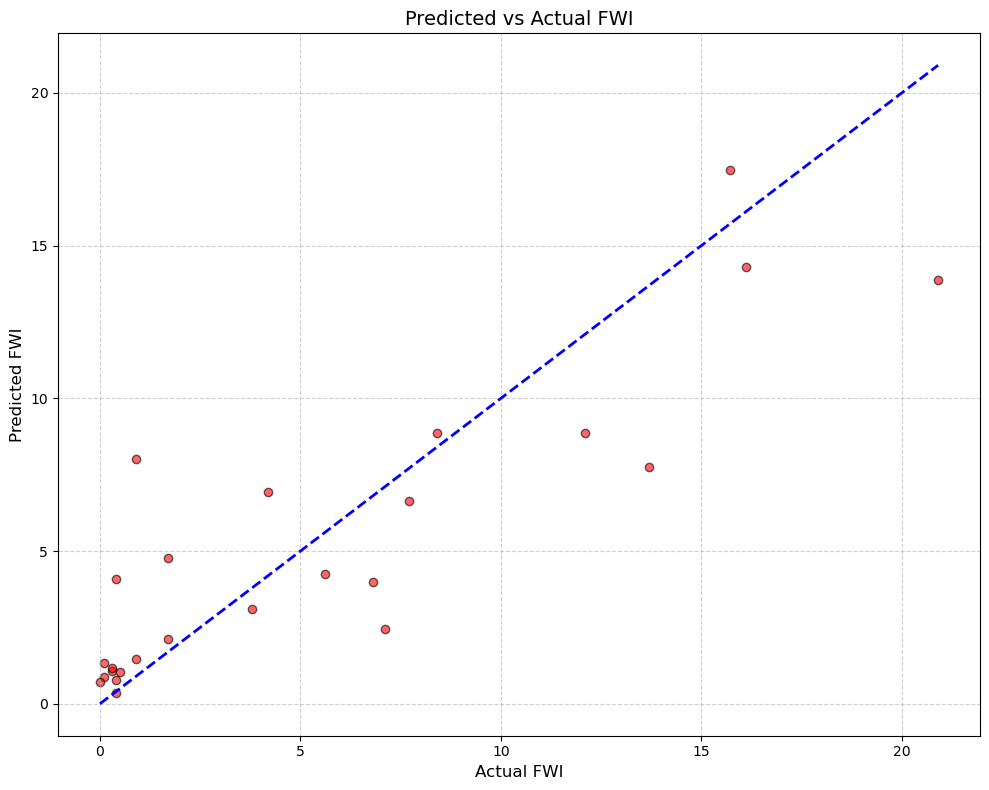

In [31]:

features = ["Temperature","RH","Ws","Rain","day"] #selected input features 
target = "FWI" #target varaible 

X = df[features] #input features
y = df[target]  #target 

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0) #the dataset is split into 80% testing and 20% training 

# the objective function for the optuna hyperparameter optimisation is defined 
def xgb_objective(trial):
    params = {
        "n_estimators": trial.suggest_int("n_estimators", 100, 1000),
        "max_depth": trial.suggest_int("max_depth", 3, 10),
        "learning_rate": trial.suggest_float("learning_rate", 0.001, 0.3),
        "subsample": trial.suggest_float("subsample", 0.5, 1.0),
        "colsample_bytree": trial.suggest_float("colsample_bytree", 0.5, 1.0),
        "reg_lambda": trial.suggest_float("reg_lambda", 1e-8, 5),
        "reg_alpha": trial.suggest_float("reg_alpha", 1e-8, 5),
        "random_state": 42
    }
    
    model = xgb.XGBRegressor(**params) #model is trainned 
    model.fit(X_train, y_train)
    preds = model.predict(X_test) #model trained is used to predict the FWI using the test dataset 
    rmse = np.sqrt(mean_squared_error(y_test, preds))
    return rmse

study_xgb = optuna.create_study(direction='minimize') #hyperparameters are optimised
study_xgb.optimize(xgb_objective, n_trials=30)
best_xgb_params = study_xgb.best_params
best_xgb_params['random_state'] = 42

xgb_model = xgb.XGBRegressor(**best_xgb_params) #model is trained on the best hyperparemters
xgb_model.fit(X_train, y_train)
xgb_preds = xgb_model.predict(X_test) #trained model on best hyperparameters are used to predict the FWI

print("XGBoost R²:", r2_score(y_test, xgb_preds))

plt.figure(figsize=(10, 8))
plt.scatter(y_test, xgb_preds, color='red', alpha=0.6, edgecolor='black')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], 'b--', linewidth=2) 
plt.xlabel("Actual FWI", fontsize=12)
plt.ylabel("Predicted FWI", fontsize=12)
plt.title("Predicted vs Actual FWI", fontsize=14) #the predited vs Actual plot is plotted 
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

#reference: https://medium.com/@fraidoonomarzai99/xgboost-regression-in-depth-cb2b3f623281


Light GBM

[I 2025-11-09 16:03:18,358] A new study created in memory with name: no-name-ff499cd1-3424-4da1-b591-7712dab111c0
c:\Users\VICTUS\anaconda3\Lib\site-packages\joblib\externals\loky\backend\context.py:136: UserWarning: Could not find the number of physical cores for the following reason:
[WinError 2] The system cannot find the file specified
Returning the number of logical cores instead. You can silence this warning by setting LOKY_MAX_CPU_COUNT to the number of cores you want to use.
  warnings.warn(
  File "c:\Users\VICTUS\anaconda3\Lib\site-packages\joblib\externals\loky\backend\context.py", line 257, in _count_physical_cores
    cpu_info = subprocess.run(
        "wmic CPU Get NumberOfCores /Format:csv".split(),
        capture_output=True,
        text=True,
    )
  File "c:\Users\VICTUS\anaconda3\Lib\subprocess.py", line 554, in run
    with Popen(*popenargs, **kwargs) as process:
         ~~~~~^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\VICTUS\anaconda3\Lib\subprocess.py", line 1039, 

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000028 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 88
[LightGBM] [Info] Number of data points in the train set: 97, number of used features: 5
[LightGBM] [Info] Start training from score 5.677320
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2025-11-09 16:03:18,458] Trial 2 finished with value: 3.1855218143226156 and parameters: {'n_estimators': 242, 'num_leaves': 69, 'max_depth': 12, 'learning_rate': 0.2358651969295823, 'subsample': 0.9050794872495593, 'colsample_bytree': 0.8150471302488045, 'reg_alpha': 0.5978671193915813, 'reg_lambda': 1.1449212931003383}. Best is trial 2 with value: 3.1855218143226156.
[I 2025-11-09 16:03:18,483] Trial 3 finished with value: 3.25098430232981 and parameters: {'n_estimators': 381, 'num_leaves': 67, 'max_depth': 7, 'learning_rate': 0.2888462621379229, 'subsample': 0.6026063309164235, 'colsample_bytree': 0.9030760472618555, 'reg_alpha': 2.0814733330360746, 'reg_lambda': 4.620424800472715}. Best is trial 2 with value: 3.1855218143226156.
[I 2025-11-09 16:03:18,517] Trial 4 finished with value: 3.260242843772423 and parameters: {'n_estimators': 590, 'num_leaves': 92, 'max_depth': 3, 'learning_rate': 0.1114275913657239, 'subsample': 0.9858784205456802, 'colsample_bytree': 0.876197719964165

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000044 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 88
[LightGBM] [Info] Number of data points in the train set: 97, number of used features: 5
[LightGBM] [Info] Start training from score 5.677320
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best 

[I 2025-11-09 16:03:18,592] Trial 6 finished with value: 3.4152401581301706 and parameters: {'n_estimators': 915, 'num_leaves': 189, 'max_depth': 12, 'learning_rate': 0.2862560843012365, 'subsample': 0.6536537719466969, 'colsample_bytree': 0.6436276299505647, 'reg_alpha': 2.9666317213254723, 'reg_lambda': 1.6766126558092593}. Best is trial 5 with value: 3.129631673118635.
[I 2025-11-09 16:03:18,629] Trial 7 finished with value: 3.405931968286809 and parameters: {'n_estimators': 784, 'num_leaves': 95, 'max_depth': 12, 'learning_rate': 0.2957510044714927, 'subsample': 0.710758943241498, 'colsample_bytree': 0.6220968559322022, 'reg_alpha': 4.545052865417808, 'reg_lambda': 0.9720808179131946}. Best is trial 5 with value: 3.129631673118635.
[I 2025-11-09 16:03:18,643] Trial 8 finished with value: 3.2312858432169564 and parameters: {'n_estimators': 129, 'num_leaves': 47, 'max_depth': 5, 'learning_rate': 0.17058873007138328, 'subsample': 0.7112667686135297, 'colsample_bytree': 0.8993975687740

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2025-11-09 16:03:18,690] Trial 9 finished with value: 3.3098797774480953 and parameters: {'n_estimators': 719, 'num_leaves': 179, 'max_depth': 9, 'learning_rate': 0.15074033697452308, 'subsample': 0.6708372798758114, 'colsample_bytree': 0.9613222017514914, 'reg_alpha': 2.8078634859926948, 'reg_lambda': 2.9417965635606116}. Best is trial 5 with value: 3.129631673118635.
[I 2025-11-09 16:03:18,746] Trial 10 finished with value: 3.3934228392426142 and parameters: {'n_estimators': 381, 'num_leaves': 22, 'max_depth': 15, 'learning_rate': 0.024650809884944253, 'subsample': 0.8020491233889022, 'colsample_bytree': 0.7211835984738139, 'reg_alpha': 0.008929785071872143, 'reg_lambda': 3.1288338284164956}. Best is trial 5 with value: 3.129631673118635.
[I 2025-11-09 16:03:18,783] Trial 11 finished with value: 3.267578517699504 and parameters: {'n_estimators': 334, 'num_leaves': 147, 'max_depth': 12, 'learning_rate': 0.21742204095503848, 'subsample': 0.8817109004161469, 'colsample_bytree': 0.762

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000039 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 88
[LightGBM] [Info] Number of data points in the train set: 97, number of used features: 5
[LightGBM] [Info] Start training from score 5.677320
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best 

[I 2025-11-09 16:03:18,817] Trial 12 finished with value: 3.2128289819626774 and parameters: {'n_estimators': 258, 'num_leaves': 62, 'max_depth': 13, 'learning_rate': 0.2217330283545291, 'subsample': 0.8970848994531637, 'colsample_bytree': 0.816459532387926, 'reg_alpha': 1.188739076960657, 'reg_lambda': 1.4386685255310148}. Best is trial 5 with value: 3.129631673118635.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000030 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 88
[LightGBM] [Info] Number of data points in the train set: 97, number of used features: 5
[LightGBM] [Info] Start training from score 5.677320
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best 

[I 2025-11-09 16:03:18,867] Trial 13 finished with value: 3.260966209379115 and parameters: {'n_estimators': 537, 'num_leaves': 134, 'max_depth': 14, 'learning_rate': 0.17579199907960316, 'subsample': 0.9073398527402979, 'colsample_bytree': 0.7093281263617564, 'reg_alpha': 0.8266524081019784, 'reg_lambda': 0.14871125706048693}. Best is trial 5 with value: 3.129631673118635.
[I 2025-11-09 16:03:18,900] Trial 14 finished with value: 3.2922059421632075 and parameters: {'n_estimators': 246, 'num_leaves': 28, 'max_depth': 10, 'learning_rate': 0.12449944192580974, 'subsample': 0.8536789555269975, 'colsample_bytree': 0.8175262105091337, 'reg_alpha': 1.6083392080005257, 'reg_lambda': 3.8578628536912207}. Best is trial 5 with value: 3.129631673118635.
[I 2025-11-09 16:03:18,948] Trial 15 finished with value: 3.3123679094240566 and parameters: {'n_estimators': 506, 'num_leaves': 71, 'max_depth': 11, 'learning_rate': 0.2431664875393353, 'subsample': 0.7701542435033176, 'colsample_bytree': 0.68343

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-11-09 16:03:19,029] Trial 17 finished with value: 3.344124659792098 and parameters: {'n_estimators': 229, 'num_leaves': 124, 'max_depth': 7, 'learning_rate': 0.07817272971323964, 'subsample': 0.7805951837807199, 'colsample_bytree': 0.8473548751422095, 'reg_alpha': 1.4017726565642787, 'reg_lambda': 2.9740423106242333}. Best is trial 5 with value: 3.129631673118635.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000035 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 88
[LightGBM] [Info] Number of data points in the train set: 97, number of used features: 5
[LightGBM] [Info] Start training from score 5.677320
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best 

[I 2025-11-09 16:03:19,066] Trial 18 finished with value: 3.188992349367315 and parameters: {'n_estimators': 304, 'num_leaves': 77, 'max_depth': 10, 'learning_rate': 0.25142879300519566, 'subsample': 0.9474455550440752, 'colsample_bytree': 0.7610131009211921, 'reg_alpha': 2.3643003212979368, 'reg_lambda': 1.0498331289533758}. Best is trial 5 with value: 3.129631673118635.
[I 2025-11-09 16:03:19,094] Trial 19 finished with value: 3.2409327477828507 and parameters: {'n_estimators': 192, 'num_leaves': 45, 'max_depth': 13, 'learning_rate': 0.19184359847877733, 'subsample': 0.8399456749717662, 'colsample_bytree': 0.6604925007734548, 'reg_alpha': 0.4721891082963574, 'reg_lambda': 3.9874688634411504}. Best is trial 5 with value: 3.129631673118635.
[I 2025-11-09 16:03:19,136] Trial 20 finished with value: 3.1651774083134603 and parameters: {'n_estimators': 433, 'num_leaves': 111, 'max_depth': 7, 'learning_rate': 0.25785710335870826, 'subsample': 0.7391950912942283, 'colsample_bytree': 0.740360

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-11-09 16:03:19,217] Trial 22 finished with value: 3.1332486046790895 and parameters: {'n_estimators': 440, 'num_leaves': 116, 'max_depth': 7, 'learning_rate': 0.26442082246464743, 'subsample': 0.7321906308033611, 'colsample_bytree': 0.7239203982173087, 'reg_alpha': 1.7918221082774042, 'reg_lambda': 2.636233655588771}. Best is trial 5 with value: 3.129631673118635.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000158 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 88
[LightGBM] [Info] Number of data points in the train set: 97, number of used features: 5
[LightGBM] [Info] Start training from score 5.677320
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best 

[I 2025-11-09 16:03:19,273] Trial 23 finished with value: 3.2087207480526208 and parameters: {'n_estimators': 594, 'num_leaves': 159, 'max_depth': 5, 'learning_rate': 0.20216611865672057, 'subsample': 0.7400301689177575, 'colsample_bytree': 0.6842607664049595, 'reg_alpha': 2.4874917311126703, 'reg_lambda': 3.4570634296506855}. Best is trial 5 with value: 3.129631673118635.
[I 2025-11-09 16:03:19,317] Trial 24 finished with value: 3.2803449561440297 and parameters: {'n_estimators': 463, 'num_leaves': 111, 'max_depth': 6, 'learning_rate': 0.2616621719285124, 'subsample': 0.6736416370714025, 'colsample_bytree': 0.6971056717588793, 'reg_alpha': 2.0904384781081515, 'reg_lambda': 2.679287417222157}. Best is trial 5 with value: 3.129631673118635.
[I 2025-11-09 16:03:19,359] Trial 25 finished with value: 3.3101182310400104 and parameters: {'n_estimators': 632, 'num_leaves': 124, 'max_depth': 8, 'learning_rate': 0.2682529192336492, 'subsample': 0.7380016412467442, 'colsample_bytree': 0.60729239

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [W

[I 2025-11-09 16:03:19,488] Trial 28 finished with value: 3.2307812282659474 and parameters: {'n_estimators': 407, 'num_leaves': 135, 'max_depth': 6, 'learning_rate': 0.27210791260740685, 'subsample': 0.6222756495250392, 'colsample_bytree': 0.7250939827755056, 'reg_alpha': 0.9076738839391317, 'reg_lambda': 2.6824575813527067}. Best is trial 5 with value: 3.129631673118635.
[I 2025-11-09 16:03:19,542] Trial 29 finished with value: 3.265753227953694 and parameters: {'n_estimators': 710, 'num_leaves': 106, 'max_depth': 8, 'learning_rate': 0.23415245710831034, 'subsample': 0.7008928742679092, 'colsample_bytree': 0.6744438334605553, 'reg_alpha': 2.1878295582455136, 'reg_lambda': 2.0507695615371713}. Best is trial 5 with value: 3.129631673118635.
[I 2025-11-09 16:03:19,579] Trial 30 finished with value: 3.258178658658942 and parameters: {'n_estimators': 299, 'num_leaves': 117, 'max_depth': 10, 'learning_rate': 0.17351174228977856, 'subsample': 0.7599352354430142, 'colsample_bytree': 0.742222

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000078 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 88
[LightGBM] [Info] Number of data points in the train set: 97, number of used features: 5
[LightGBM] [Info] Start training from score 5.677320
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best 

[I 2025-11-09 16:03:19,709] Trial 33 finished with value: 3.1391281279493928 and parameters: {'n_estimators': 335, 'num_leaves': 87, 'max_depth': 5, 'learning_rate': 0.27026108462837584, 'subsample': 0.6899914846827144, 'colsample_bytree': 0.7951459603700545, 'reg_alpha': 1.9112752323631423, 'reg_lambda': 2.9921092699546423}. Best is trial 5 with value: 3.129631673118635.
[I 2025-11-09 16:03:19,772] Trial 34 finished with value: 3.192051896743451 and parameters: {'n_estimators': 339, 'num_leaves': 86, 'max_depth': 4, 'learning_rate': 0.2793000126051263, 'subsample': 0.6871546082502362, 'colsample_bytree': 0.7960273820686276, 'reg_alpha': 1.954025160660639, 'reg_lambda': 3.683685137757289}. Best is trial 5 with value: 3.129631673118635.
[I 2025-11-09 16:03:19,813] Trial 35 finished with value: 3.241205318676061 and parameters: {'n_estimators': 199, 'num_leaves': 56, 'max_depth': 5, 'learning_rate': 0.23725975784320807, 'subsample': 0.7900818198549983, 'colsample_bytree': 0.8493116396911

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000027 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 88
[LightGBM] [Info] Number of data points in the train set: 97, number of used features: 5
[LightGBM] [Info] Start training from score 5.677320
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best 

[I 2025-11-09 16:03:19,941] Trial 38 finished with value: 3.171899896327968 and parameters: {'n_estimators': 939, 'num_leaves': 123, 'max_depth': 4, 'learning_rate': 0.23006881670345153, 'subsample': 0.7214275251896116, 'colsample_bytree': 0.7763544755616435, 'reg_alpha': 2.324092041429045, 'reg_lambda': 2.8285896352519186}. Best is trial 5 with value: 3.129631673118635.
[I 2025-11-09 16:03:19,988] Trial 39 finished with value: 3.162952476301147 and parameters: {'n_estimators': 618, 'num_leaves': 91, 'max_depth': 6, 'learning_rate': 0.280182578777769, 'subsample': 0.695274279369153, 'colsample_bytree': 0.8400165010218769, 'reg_alpha': 1.8974066719887643, 'reg_lambda': 3.1932124006967118}. Best is trial 5 with value: 3.129631673118635.
[I 2025-11-09 16:03:20,036] Trial 40 finished with value: 3.258949170250208 and parameters: {'n_estimators': 807, 'num_leaves': 93, 'max_depth': 6, 'learning_rate': 0.28232846312733373, 'subsample': 0.6914501337564569, 'colsample_bytree': 0.84259079588664

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-11-09 16:03:20,136] Trial 42 finished with value: 3.1452163934628112 and parameters: {'n_estimators': 641, 'num_leaves': 62, 'max_depth': 5, 'learning_rate': 0.2464249183315911, 'subsample': 0.6578567072330089, 'colsample_bytree': 0.8851288292019915, 'reg_alpha': 1.828173721466884, 'reg_lambda': 3.7083086939482595}. Best is trial 5 with value: 3.129631673118635.
[I 2025-11-09 16:03:20,193] Trial 43 finished with value: 3.23684780528522 and parameters: {'n_estimators': 657, 'num_leaves': 56, 'max_depth': 5, 'learning_rate': 0.27291834762347084, 'subsample': 0.6000672100109322, 'colsample_bytree': 0.8939900567068498, 'reg_alpha': 1.1521272295091416, 'reg_lambda': 3.746401664425087}. Best is trial 5 with value: 3.129631673118635.
[I 2025-11-09 16:03:20,248] Trial 44 finished with value: 3.1667692015033477 and parameters: {'n_estimators': 822, 'num_leaves': 37, 'max_depth': 3, 'learning_rate': 0.2518579759031723, 'subsample': 0.651793475967638, 'colsample_bytree': 0.887383540511463

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-11-09 16:03:20,347] Trial 46 finished with value: 3.2319655194547456 and parameters: {'n_estimators': 537, 'num_leaves': 65, 'max_depth': 4, 'learning_rate': 0.18478867403518343, 'subsample': 0.627034046068225, 'colsample_bytree': 0.8607383036364578, 'reg_alpha': 3.0845243012068844, 'reg_lambda': 3.1298154451843736}. Best is trial 5 with value: 3.129631673118635.
[I 2025-11-09 16:03:20,412] Trial 47 finished with value: 3.273697216073474 and parameters: {'n_estimators': 731, 'num_leaves': 93, 'max_depth': 6, 'learning_rate': 0.2660613443972274, 'subsample': 0.8631233443386607, 'colsample_bytree': 0.8309027968642549, 'reg_alpha': 0.7374152113608774, 'reg_lambda': 3.4407826265538364}. Best is trial 5 with value: 3.129631673118635.
[I 2025-11-09 16:03:20,456] Trial 48 finished with value: 3.2530588267246254 and parameters: {'n_estimators': 567, 'num_leaves': 68, 'max_depth': 8, 'learning_rate': 0.24416668933719585, 'subsample': 0.7027888102306226, 'colsample_bytree': 0.81460572139

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000048 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 88
[LightGBM] [Info] Number of data points in the train set: 97, number of used features: 5
[LightGBM] [Info] Start training from score 5.677320
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best 

[I 2025-11-09 16:03:20,544] Trial 50 finished with value: 3.2870459020219327 and parameters: {'n_estimators': 493, 'num_leaves': 199, 'max_depth': 11, 'learning_rate': 0.15735810260149402, 'subsample': 0.647023608664207, 'colsample_bytree': 0.9172326029211446, 'reg_alpha': 4.965274212462073, 'reg_lambda': 4.480595198911832}. Best is trial 5 with value: 3.129631673118635.
[I 2025-11-09 16:03:20,620] Trial 51 finished with value: 3.3224779859269824 and parameters: {'n_estimators': 400, 'num_leaves': 101, 'max_depth': 7, 'learning_rate': 0.23086428682365662, 'subsample': 0.7186936213743128, 'colsample_bytree': 0.9669578229848399, 'reg_alpha': 1.4610799232084657, 'reg_lambda': 3.094602037982224}. Best is trial 5 with value: 3.129631673118635.
[I 2025-11-09 16:03:20,708] Trial 52 finished with value: 3.3334403644466204 and parameters: {'n_estimators': 615, 'num_leaves': 116, 'max_depth': 6, 'learning_rate': 0.24545118269785748, 'subsample': 0.7071626718087699, 'colsample_bytree': 0.71204914

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-11-09 16:03:20,810] Trial 53 finished with value: 3.2189416435187246 and parameters: {'n_estimators': 681, 'num_leaves': 77, 'max_depth': 9, 'learning_rate': 0.282097400302769, 'subsample': 0.6658335939934497, 'colsample_bytree': 0.7983921651300656, 'reg_alpha': 1.8670658954003432, 'reg_lambda': 2.462864403463675}. Best is trial 5 with value: 3.129631673118635.
[I 2025-11-09 16:03:20,857] Trial 54 finished with value: 3.164203772541734 and parameters: {'n_estimators': 322, 'num_leaves': 38, 'max_depth': 5, 'learning_rate': 0.2262464509834529, 'subsample': 0.7820061803228783, 'colsample_bytree': 0.7523791899443276, 'reg_alpha': 2.383183031862456, 'reg_lambda': 1.8798008624121074}. Best is trial 5 with value: 3.129631673118635.
[I 2025-11-09 16:03:20,893] Trial 55 finished with value: 3.2068758555221364 and parameters: {'n_estimators': 271, 'num_leaves': 35, 'max_depth': 5, 'learning_rate': 0.2157051402541374, 'subsample': 0.7873771124759105, 'colsample_bytree': 0.757668714968086

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000054 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 88
[LightGBM] [Info] Number of data points in the train set: 97, number of used features: 5
[LightGBM] [Info] Start training from score 5.677320
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best 

[I 2025-11-09 16:03:20,973] Trial 57 finished with value: 3.2782265213151116 and parameters: {'n_estimators': 212, 'num_leaves': 22, 'max_depth': 5, 'learning_rate': 0.09082818326374245, 'subsample': 0.7611299841726511, 'colsample_bytree': 0.7834158199199007, 'reg_alpha': 2.225884729350486, 'reg_lambda': 1.3429118424510977}. Best is trial 5 with value: 3.129631673118635.
[I 2025-11-09 16:03:21,014] Trial 58 finished with value: 3.2521498837868332 and parameters: {'n_estimators': 267, 'num_leaves': 39, 'max_depth': 14, 'learning_rate': 0.26061704513281403, 'subsample': 0.8392710316546428, 'colsample_bytree': 0.8052040567122744, 'reg_alpha': 2.489144877534687, 'reg_lambda': 0.6128595227570992}. Best is trial 5 with value: 3.129631673118635.
[I 2025-11-09 16:03:21,044] Trial 59 finished with value: 3.088951834846454 and parameters: {'n_estimators': 167, 'num_leaves': 52, 'max_depth': 3, 'learning_rate': 0.27509140487032224, 'subsample': 0.7484853251186194, 'colsample_bytree': 0.8772789374

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000042 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 88
[LightGBM] [Info] Number of data points in the train set: 97, number of used features: 5
[LightGBM] [Info] Start training from score 5.677320
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best 

[I 2025-11-09 16:03:21,183] Trial 63 finished with value: 3.251441164733319 and parameters: {'n_estimators': 104, 'num_leaves': 62, 'max_depth': 4, 'learning_rate': 0.2658142933817257, 'subsample': 0.8072720930437658, 'colsample_bytree': 0.9863488487513206, 'reg_alpha': 0.05721008776554121, 'reg_lambda': 2.8562201825010805}. Best is trial 59 with value: 3.088951834846454.
[I 2025-11-09 16:03:21,220] Trial 64 finished with value: 3.2464070240618557 and parameters: {'n_estimators': 164, 'num_leaves': 54, 'max_depth': 4, 'learning_rate': 0.2507418120339639, 'subsample': 0.7458165945080015, 'colsample_bytree': 0.9433510246140845, 'reg_alpha': 0.7225472727723742, 'reg_lambda': 3.3662508305318686}. Best is trial 59 with value: 3.088951834846454.
[I 2025-11-09 16:03:21,274] Trial 65 finished with value: 3.3796136241672072 and parameters: {'n_estimators': 562, 'num_leaves': 43, 'max_depth': 3, 'learning_rate': 0.2881134116556645, 'subsample': 0.6951025633284567, 'colsample_bytree': 0.861936511

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000031 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 88
[LightGBM] [Info] Number of data points in the train set: 97, number of used features: 5
[LightGBM] [Info] Start training from score 5.677320
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best 

[I 2025-11-09 16:03:21,410] Trial 68 finished with value: 3.1652458849268603 and parameters: {'n_estimators': 233, 'num_leaves': 83, 'max_depth': 4, 'learning_rate': 0.2777280184898612, 'subsample': 0.7983486697527928, 'colsample_bytree': 0.9021714049514672, 'reg_alpha': 0.6338610161635247, 'reg_lambda': 1.5307992846395977}. Best is trial 59 with value: 3.088951834846454.
[I 2025-11-09 16:03:21,462] Trial 69 finished with value: 3.3097805928861534 and parameters: {'n_estimators': 376, 'num_leaves': 63, 'max_depth': 3, 'learning_rate': 0.29229284524335514, 'subsample': 0.6629355504162988, 'colsample_bytree': 0.9537045546764503, 'reg_alpha': 0.9078297327080239, 'reg_lambda': 2.1322264399311135}. Best is trial 59 with value: 3.088951834846454.
[I 2025-11-09 16:03:21,512] Trial 70 finished with value: 3.2955453432223156 and parameters: {'n_estimators': 492, 'num_leaves': 52, 'max_depth': 13, 'learning_rate': 0.2455012034065399, 'subsample': 0.6371114500146309, 'colsample_bytree': 0.8315037

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000032 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 88
[LightGBM] [Info] Number of data points in the train set: 97, number of used features: 5
[LightGBM] [Info] Start training from score 5.677320
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best 

[I 2025-11-09 16:03:21,618] Trial 73 finished with value: 3.1638420594848493 and parameters: {'n_estimators': 183, 'num_leaves': 26, 'max_depth': 6, 'learning_rate': 0.2613391308363186, 'subsample': 0.8196279284215505, 'colsample_bytree': 0.7678274680768674, 'reg_alpha': 2.0508684175864773, 'reg_lambda': 1.2343375498659501}. Best is trial 59 with value: 3.088951834846454.
[I 2025-11-09 16:03:21,651] Trial 74 finished with value: 3.1407741957057866 and parameters: {'n_estimators': 122, 'num_leaves': 31, 'max_depth': 6, 'learning_rate': 0.2743198087108035, 'subsample': 0.7951428981925174, 'colsample_bytree': 0.7337402923485027, 'reg_alpha': 1.7730422933099172, 'reg_lambda': 3.2704225920441536}. Best is trial 59 with value: 3.088951834846454.
[I 2025-11-09 16:03:21,707] Trial 75 finished with value: 3.1633750865903023 and parameters: {'n_estimators': 216, 'num_leaves': 29, 'max_depth': 7, 'learning_rate': 0.2543128766858818, 'subsample': 0.793568644436616, 'colsample_bytree': 0.7348251618

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000032 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 88
[LightGBM] [Info] Number of data points in the train set: 97, number of used features: 5
[LightGBM] [Info] Start training from score 5.677320
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best 

[I 2025-11-09 16:03:21,805] Trial 78 finished with value: 3.240276826711582 and parameters: {'n_estimators': 196, 'num_leaves': 59, 'max_depth': 11, 'learning_rate': 0.12297444763627582, 'subsample': 0.8104311909940873, 'colsample_bytree': 0.6962728617111416, 'reg_alpha': 1.771415016531582, 'reg_lambda': 1.9966379995882073}. Best is trial 59 with value: 3.088951834846454.
[I 2025-11-09 16:03:21,845] Trial 79 finished with value: 3.4099244048079496 and parameters: {'n_estimators': 246, 'num_leaves': 45, 'max_depth': 7, 'learning_rate': 0.01286983647045728, 'subsample': 0.7342076845584004, 'colsample_bytree': 0.7236309876925745, 'reg_alpha': 3.510993584739552, 'reg_lambda': 0.8675526961435442}. Best is trial 59 with value: 3.088951834846454.
[I 2025-11-09 16:03:21,883] Trial 80 finished with value: 3.3081441068469584 and parameters: {'n_estimators': 275, 'num_leaves': 42, 'max_depth': 5, 'learning_rate': 0.05050113922998965, 'subsample': 0.8290996353423351, 'colsample_bytree': 0.78443756

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000039 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 88
[LightGBM] [Info] Number of data points in the train set: 97, number of used features: 5
[LightGBM] [Info] Start training from score 5.677320
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best 

[I 2025-11-09 16:03:22,054] Trial 85 finished with value: 3.198904885670611 and parameters: {'n_estimators': 201, 'num_leaves': 120, 'max_depth': 7, 'learning_rate': 0.2608603026647756, 'subsample': 0.7974323316998139, 'colsample_bytree': 0.7052917080390094, 'reg_alpha': 1.5517335287672365, 'reg_lambda': 2.757402190912027}. Best is trial 59 with value: 3.088951834846454.
[I 2025-11-09 16:03:22,097] Trial 86 finished with value: 3.2419226359399262 and parameters: {'n_estimators': 239, 'num_leaves': 100, 'max_depth': 4, 'learning_rate': 0.23788846831229904, 'subsample': 0.753745320190082, 'colsample_bytree': 0.7404193897484771, 'reg_alpha': 2.6280396174688896, 'reg_lambda': 3.053894369572057}. Best is trial 59 with value: 3.088951834846454.
[I 2025-11-09 16:03:22,139] Trial 87 finished with value: 3.2846611715786365 and parameters: {'n_estimators': 355, 'num_leaves': 72, 'max_depth': 6, 'learning_rate': 0.2860786310348099, 'subsample': 0.7810238058074054, 'colsample_bytree': 0.6631114981

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000019 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 88
[LightGBM] [Info] Number of data points in the train set: 97, number of used features: 5
[LightGBM] [Info] Start training from score 5.677320
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2025-11-09 16:03:22,280] Trial 89 finished with value: 3.2235300612331157 and parameters: {'n_estimators': 415, 'num_leaves': 57, 'max_depth': 10, 'learning_rate': 0.18324113266368014, 'subsample': 0.6157667543287016, 'colsample_bytree': 0.6454682212036807, 'reg_alpha': 1.8120327063910313, 'reg_lambda': 1.6079935246055481}. Best is trial 59 with value: 3.088951834846454.
[I 2025-11-09 16:03:22,322] Trial 90 finished with value: 3.2594043561838713 and parameters: {'n_estimators': 119, 'num_leaves': 149, 'max_depth': 5, 'learning_rate': 0.16278421513880095, 'subsample': 0.7424310671032084, 'colsample_bytree': 0.7727143276840811, 'reg_alpha': 2.1041372476861366, 'reg_lambda': 2.9307504895353693}. Best is trial 59 with value: 3.088951834846454.
[I 2025-11-09 16:03:22,380] Trial 91 finished with value: 3.180966483019611 and parameters: {'n_estimators': 601, 'num_leaves': 113, 'max_depth': 6, 'learning_rate': 0.2833537932533116, 'subsample': 0.8129008044542148, 'colsample_bytree': 0.89693

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000041 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 88
[LightGBM] [Info] Number of data points in the train set: 97, number of used features: 5
[LightGBM] [Info] Start training from score 5.677320
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best 

[I 2025-11-09 16:03:22,491] Trial 93 finished with value: 3.195370329376119 and parameters: {'n_estimators': 524, 'num_leaves': 96, 'max_depth': 5, 'learning_rate': 0.26654267735167636, 'subsample': 0.6981297606175305, 'colsample_bytree': 0.8046094857695568, 'reg_alpha': 1.7064423824703527, 'reg_lambda': 3.2044501339438276}. Best is trial 59 with value: 3.088951834846454.
[I 2025-11-09 16:03:22,535] Trial 94 finished with value: 3.208037316747365 and parameters: {'n_estimators': 148, 'num_leaves': 78, 'max_depth': 6, 'learning_rate': 0.27700473760513833, 'subsample': 0.7897626483253933, 'colsample_bytree': 0.7904749165050737, 'reg_alpha': 1.8655829204183623, 'reg_lambda': 2.5876978974335505}. Best is trial 59 with value: 3.088951834846454.
[I 2025-11-09 16:03:22,636] Trial 95 finished with value: 3.209352969455547 and parameters: {'n_estimators': 639, 'num_leaves': 66, 'max_depth': 4, 'learning_rate': 0.29415094376604844, 'subsample': 0.7108745026512181, 'colsample_bytree': 0.818756434

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-11-09 16:03:22,721] Trial 96 finished with value: 3.3202300439195596 and parameters: {'n_estimators': 704, 'num_leaves': 90, 'max_depth': 7, 'learning_rate': 0.1994527640648146, 'subsample': 0.7601697889269248, 'colsample_bytree': 0.8386394364376204, 'reg_alpha': 0.24034079261259925, 'reg_lambda': 3.6301185184997697}. Best is trial 59 with value: 3.088951834846454.
[I 2025-11-09 16:03:22,765] Trial 97 finished with value: 3.1014204726889085 and parameters: {'n_estimators': 285, 'num_leaves': 51, 'max_depth': 3, 'learning_rate': 0.26374463711045765, 'subsample': 0.7246950202589476, 'colsample_bytree': 0.7180739680937203, 'reg_alpha': 0.4643938809885463, 'reg_lambda': 2.9261230391942235}. Best is trial 59 with value: 3.088951834846454.
[I 2025-11-09 16:03:22,803] Trial 98 finished with value: 3.1968310731979015 and parameters: {'n_estimators': 225, 'num_leaves': 51, 'max_depth': 3, 'learning_rate': 0.14205350271657619, 'subsample': 0.7487615431167904, 'colsample_bytree': 0.717701

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000043 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 88
[LightGBM] [Info] Number of data points in the train set: 97, number of used features: 5
[LightGBM] [Info] Start training from score 5.677320
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best 

[I 2025-11-09 16:03:22,903] Trial 99 finished with value: 3.189176258623406 and parameters: {'n_estimators': 397, 'num_leaves': 40, 'max_depth': 3, 'learning_rate': 0.24348987185699417, 'subsample': 0.7293084697713004, 'colsample_bytree': 0.7328372445695003, 'reg_alpha': 0.42961773652523394, 'reg_lambda': 2.046388076818065}. Best is trial 59 with value: 3.088951834846454.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

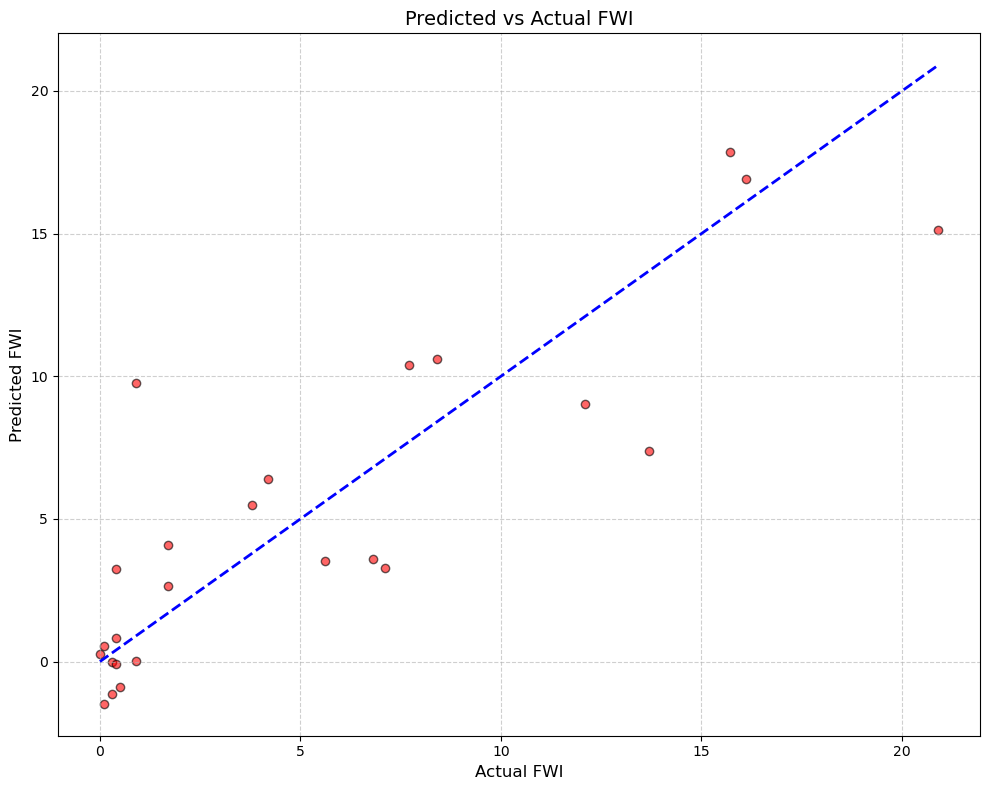

In [32]:

def lgb_objective(trial): #objective function is defined for hyperparameter tuning 
    params = {
        "n_estimators": trial.suggest_int("n_estimators", 100, 1000),
        "num_leaves": trial.suggest_int("num_leaves", 20, 200),
        "max_depth": trial.suggest_int("max_depth", 3, 15),
        "learning_rate": trial.suggest_float("learning_rate", 0.01, 0.3, log=False),
        "subsample": trial.suggest_float("subsample", 0.6, 1.0),
        "colsample_bytree": trial.suggest_float("colsample_bytree", 0.6, 1.0),
        "reg_alpha": trial.suggest_float("reg_alpha", 0.0, 5.0),
        "reg_lambda": trial.suggest_float("reg_lambda", 0.0, 5.0),
        "random_state": 42
    }
    
    model = lgb.LGBMRegressor(**params)  #initially the model is trained for the above sample hyperparameters
    model.fit(X_train, y_train)
    preds = model.predict(X_test)
    rmse = np.sqrt(mean_squared_error(y_test, preds))
    return rmse

study_lgb = optuna.create_study(direction='minimize') # the hyperparameter optimisation is run for 100 trials
study_lgb.optimize(lgb_objective, n_trials=100)
best_lgb_params = study_lgb.best_params
best_lgb_params['random_state'] = 42

lgb_model = lgb.LGBMRegressor(**best_lgb_params) #the best hyperparameters and the used to train the final Light GBM model
lgb_model.fit(X_train, y_train)
lgb_preds = lgb_model.predict(X_test)

print("LightGBM R²:", r2_score(y_test, lgb_preds))

plt.figure(figsize=(10, 8))
plt.scatter(y_test, lgb_preds, color='red', alpha=0.6, edgecolor='black')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], 'b--', linewidth=2) 
plt.xlabel("Actual FWI", fontsize=12)
plt.ylabel("Predicted FWI", fontsize=12)
plt.title("Predicted vs Actual FWI", fontsize=14) #predicted Vs Actual plot
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

#reference: https://forecastegy.com/posts/how-to-use-optuna-to-tune-lightgbm-hyperparameters/


Random Forest Regressor 

[I 2025-11-09 16:03:23,069] A new study created in memory with name: no-name-df9e1d77-a758-4119-be61-3b980dba7ebf
[I 2025-11-09 16:03:24,190] Trial 0 finished with value: 3.619972897122465 and parameters: {'n_estimators': 993, 'max_depth': 5, 'min_samples_split': 18, 'min_samples_leaf': 7}. Best is trial 0 with value: 3.619972897122465.
[I 2025-11-09 16:03:25,197] Trial 1 finished with value: 3.377905969661817 and parameters: {'n_estimators': 920, 'max_depth': 15, 'min_samples_split': 7, 'min_samples_leaf': 4}. Best is trial 1 with value: 3.377905969661817.
[I 2025-11-09 16:03:25,360] Trial 2 finished with value: 3.5100192436676245 and parameters: {'n_estimators': 108, 'max_depth': 4, 'min_samples_split': 10, 'min_samples_leaf': 4}. Best is trial 1 with value: 3.377905969661817.
[I 2025-11-09 16:03:25,868] Trial 3 finished with value: 3.8301840389986714 and parameters: {'n_estimators': 444, 'max_depth': 15, 'min_samples_split': 18, 'min_samples_leaf': 4}. Best is trial 1 with value: 3.

Random Forest R²: 0.6995058543803787


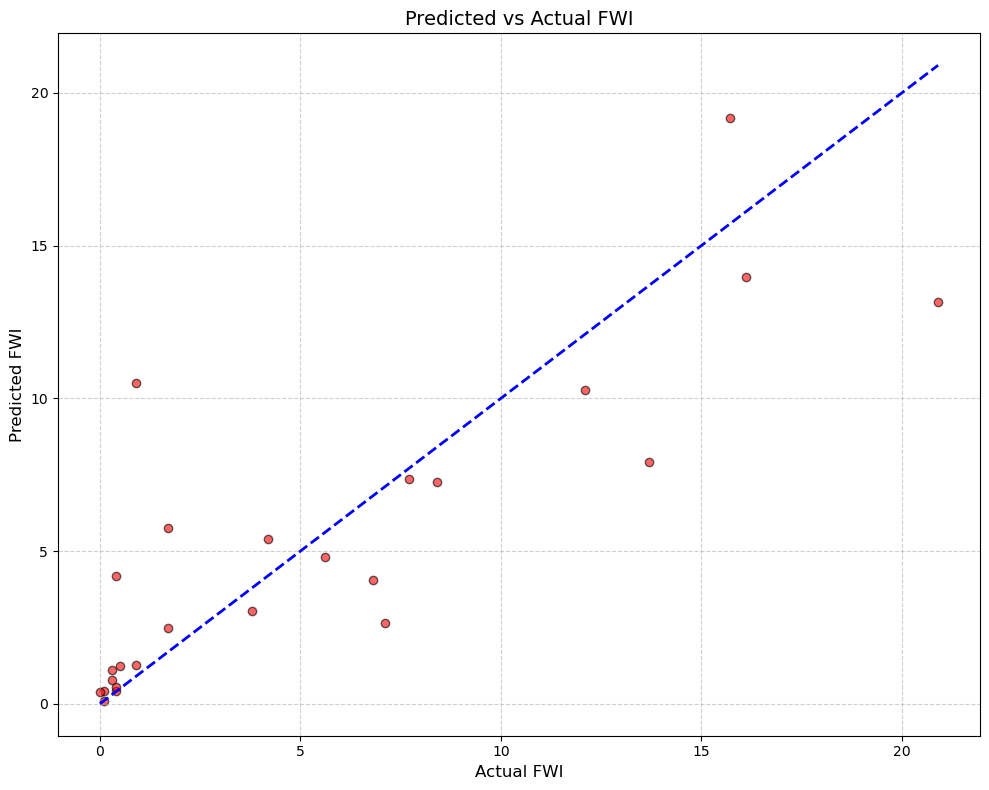

In [33]:

def rf_objective(trial): #objective function for Optuna
    params = {
        "n_estimators": trial.suggest_int("n_estimators", 100, 1000), #total number of trees in the forest
        "max_depth": trial.suggest_int("max_depth", 3, 15), #maximum depth of each decision tree
        "min_samples_split": trial.suggest_int("min_samples_split", 2, 20), 
        "min_samples_leaf": trial.suggest_int("min_samples_leaf", 1, 10),
        "random_state": 42,
        "n_jobs": -1 #uses all CPU cores for faster computaiton
    }
    
    model = RandomForestRegressor(**params)   #random forest model is trained 
    model.fit(X_train, y_train)
    preds = model.predict(X_test)
    rmse = np.sqrt(mean_squared_error(y_test, preds))
    return rmse

study_rf = optuna.create_study(direction='minimize')  #Optuna hyperparameter optimisation is conducted 
study_rf.optimize(rf_objective, n_trials=100)
best_rf_params = study_rf.best_params
best_rf_params['random_state'] = 42
best_rf_params['n_jobs'] = -1

rf_model = RandomForestRegressor(**best_rf_params)  #using best parameters the model is then trained 
rf_model.fit(X_train, y_train)
rf_preds = rf_model.predict(X_test)

print("Random Forest R²:", r2_score(y_test, rf_preds))


plt.figure(figsize=(10, 8))
plt.scatter(y_test, rf_preds, color='red', alpha=0.6, edgecolor='black')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], 'b--', linewidth=2) 
plt.xlabel("Actual FWI", fontsize=12)
plt.ylabel("Predicted FWI", fontsize=12)
plt.title("Predicted vs Actual FWI", fontsize=14) #predicted vs actual plot is plotted 
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

#reference: https://medium.com/@ehsannabatchian/optimizing-random-forest-models-a-deep-dive-into-hyperparameter-tuning-with-optuna-b8e4fe7f3670